<a href="https://colab.research.google.com/github/vinay10949/AnalyticsAndML/blob/master/Kaggle/CVD/CardioVascularDiseaseDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1 style="text-align:center;font-size:30px;" > Cardiovascular Disease Detection</h1>


<h1> 1. Business Problem </h1>

Given the data of patients with 69301 record,the task is to predict the presence or absence of cardiovascular disease (CVD) using the patient examination results.

Features:


1.   Age | Objective Feature | age | int (days)
2.   Height | Objective Feature | height | int (cm) |
3.   Weight | Objective Feature | weight | float (kg) |
4.   Gender | Objective Feature | gender | categorical code |
5.   Systolic blood pressure | Examination Feature | ap_hi | int |
6.   Diastolic blood pressure | Examination Feature | ap_lo | int |
7.   Cholesterol | Examination Feature | cholesterol | 1: normal, 2: above normal, 3: well above normal |
8.   Glucose | Examination Feature | gluc | 1: normal, 2: above normal, 3: well above normal |
9.   Smoking | Subjective Feature | smoke | binary |
10.   Alcohol intake | Subjective Feature | alco | binary |
11.   Physical activity | Subjective Feature | active | binary |
12.   Presence or absence of cardiovascular disease | Target Variable | cardio | binary |

All of the dataset values were collected at the moment of medical examination.

**__Problem Statement__**
- Predict if patient is healthy or suffering from cardiovascular disease based on the given attributes.

- Model Interpretibility should be very high

- Come up with rough Causal estimate

**Constraints**
1. The cost of a error(False Negatives) can be very high.
2. No strict latency concerns.
3. Model Probablities are important(Calibration)
4. Interpretability is very important.

**<h1>Correlation Doesnt Imply Causation</h1>**


Metric(s): 
*  **FBeta Measure** Score. 

Reference :
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.fbeta_score.html

In [6]:
!sudo cp drive/Shared\ drives/ForAI/iNeuron/CardioVascularDisease.zip .
! sudo unzip CardioVascularDisease.zip
!pip install yellowbrick
!pip install feature_engine
!pip install ppscore
!pip install catboost
!pip install dowhy
!pip install category_encoders
!pip install scikit-optimizen
!pip install pdpbox
!pip install shap
!pip install eli5
!pip install lime
!pip install pdpbox

Archive:  CardioVascularDisease.zip
replace CardioVascularDisease/cardio_train.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace CardioVascularDisease/CardiovascularDiseaseDetection.docx? [y]es, [n]o, [A]ll, [N]one, [r]ename: n


# Importing Libraries

In [0]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from feature_engine.discretisers import DecisionTreeDiscretiser
from sklearn.model_selection import train_test_split
from feature_engine.categorical_encoders import OneHotCategoricalEncoder


# Reading the data

In [8]:
data=pd.read_csv("CardioVascularDisease/cardio_train.csv",sep=';')
print("Rows %d Columns %d " % (data.shape[0], data.shape[1]))
print("Target Distribution ")
print(data['cardio'].value_counts())
data.drop("id",axis=1,inplace=True)
data.describe()


Rows 69301 Columns 13 
Target Distribution 
0    34679
1    34622
Name: cardio, dtype: int64


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000,69301.000000
mean,19468.786280,1.349519,164.362217,74.203027,128.829584,96.650092,1.366806,1.226447,0.088051,0.053881,0.803986,0.499589
std,2467.261818,0.476821,8.205337,14.383469,154.775805,189.096240,0.680270,0.572246,0.283371,0.225784,0.396982,0.500003
min,10798.000000,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,17664.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,19704.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,21326.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,23713.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


In [9]:
#Removing outliers for ap_hi and ap_lo ,they have unsual values -150 and -70 respectively
data.drop(data[(data['ap_hi'] > data['ap_hi'].quantile(0.975)) | (data['ap_hi'] < data['ap_hi'].quantile(0.025))].index,inplace=True)
data.drop(data[(data['ap_lo'] > data['ap_lo'].quantile(0.975)) | (data['ap_lo'] < data['ap_lo'].quantile(0.025))].index,inplace=True)

data.describe()


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,65535.000000,65535.000000,65535.000000,65535.000000,65535.000000,65535.000000,65535.000000,65535.000000,65535.000000,65535.000000,65535.000000,65535.000000
mean,19474.699565,1.349935,164.431281,74.089740,126.248875,81.183200,1.360876,1.223926,0.087449,0.053025,0.803799,0.492851
std,2464.875237,0.476953,8.148317,14.113184,14.457877,8.402907,0.677126,0.570734,0.282495,0.224085,0.397125,0.499953
min,10798.000000,1.000000,55.000000,11.000000,100.000000,60.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,17678.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,19708.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,21330.500000,2.000000,170.000000,82.000000,140.000000,90.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,23713.000000,2.000000,250.000000,200.000000,170.000000,100.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


In [0]:

data.drop(data[(data['height'] > data['height'].quantile(0.999)) | (data['height'] < data['height'].quantile(0.025))].index,inplace=True)
data.drop(data[(data['weight'] > data['weight'].quantile(0.999)) | (data['weight'] < data['weight'].quantile(0.025))].index,inplace=True)



#Remove duplicate rows

In [0]:
#24Rows
data.duplicated().sum()

data[data.duplicated()]


data = data.drop_duplicates(keep='first')


# Exploratory Data Analysis


In [0]:
from scipy.stats import chi2_contingency

def chiSqTest(data,var1,var2):
  chi2, p, dof, ex = chi2_contingency(pd.crosstab(data[var1], data[var2], margins=True))
  print("chi2 = ", chi2)
  print("p-val = ", p)
  print("degree of freedom = ",dof)
  return chi2,p,dof,ex


#To measure the strength of nominal variables
def cramers_V(var1,var2) :
  crosstab =np.array(pd.crosstab(var1,var2, rownames=None, colnames=None)) # Cross table building
  stat = chi2_contingency(crosstab)[0] # Keeping of the test statistic of the Chi2 test
  obs = np.sum(crosstab) # Number of observations
  mini = min(crosstab.shape)-1 # Take the minimum value between the columns and the rows of the cross table
  return (stat/(obs*mini))



### Checking No of Patients Who are Physically active

**<h3>There is  significant difference in Cardio Disease between patients who  are physically active,Patients who are less active are more prone to disease </h3>**


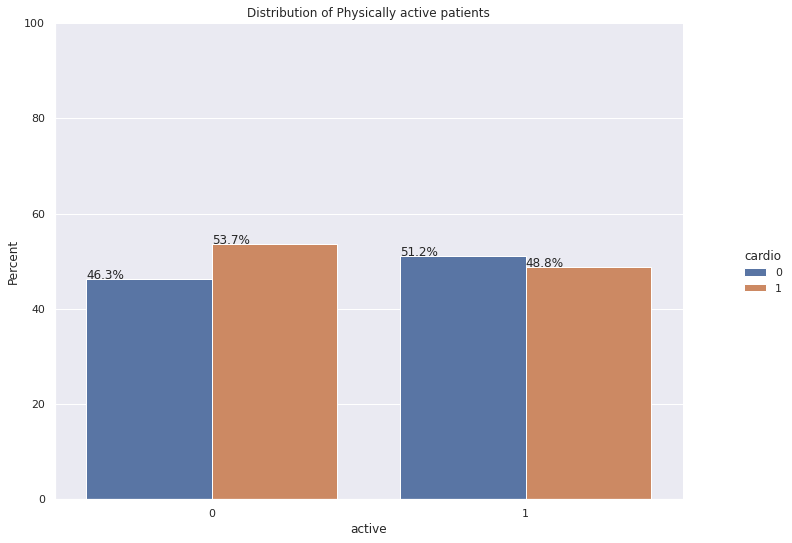

In [14]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
x,y = 'active', 'cardio'

df1 = data.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
fig = plt.gcf()
fig.set_size_inches( 12, 8)
g.ax.set(ylabel="Percent",title="Distribution of Physically active patients")

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

In [15]:
chi2,p,dof,ex=chiSqTest(data,'active','cardio')
if p<0.05:
    print("There is  significant difference in Cardio Disease between patients who  are physically active ")
else :
     print("There is no difference in Cardio Disease between patients who are physically active ")

chi2 =  91.68781716910806
p-val =  5.766291558287174e-19
degree of freedom =  4
There is  significant difference in Cardio Disease between patients who  are physically active 


### Checking Age Attribute


In [0]:
#Converting age from days to years
data['age']=data['age']/365

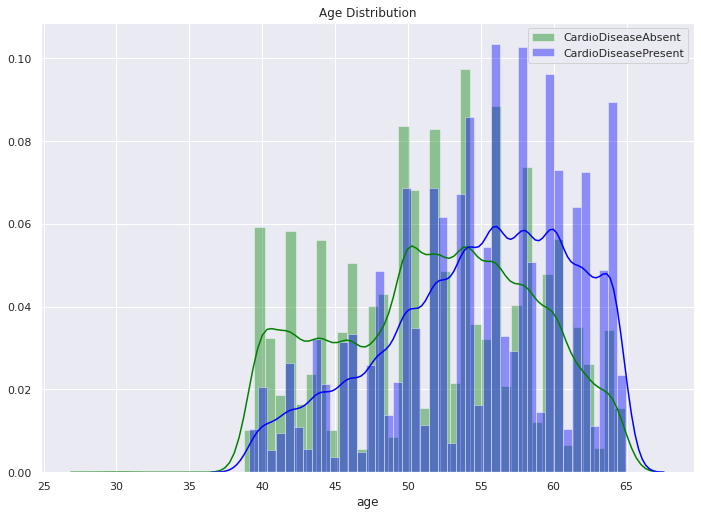

In [17]:

ax=sns.distplot(data['age'][data['cardio']==0], color='green',label='CardioDiseaseAbsent')
ax=sns.distplot(data['age'][data['cardio']==1],color='blue',label='CardioDiseasePresent')
ax.set_title('Age Distribution')
ax.legend(labels=['CardioDiseaseAbsent', 'CardioDiseasePresent'])
plt.show()

**<h3>Patients age between 55 and 60 have higher chances of having heart disease</h3>**

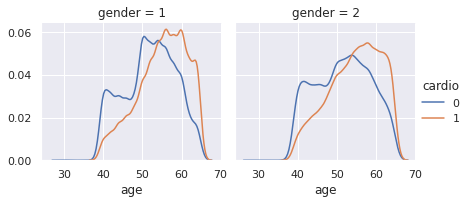

In [18]:
grid = sns.FacetGrid(data, col='gender', hue="cardio")
grid.map(sns.kdeplot, 'age')
grid.add_legend()

plt.show()


**<h3>There is slight higher chances for Gender=1 for havin heart disease between age 54-60</h3>**


### Discretizing AGE Variable

Text(0, 0.5, 'cardio')

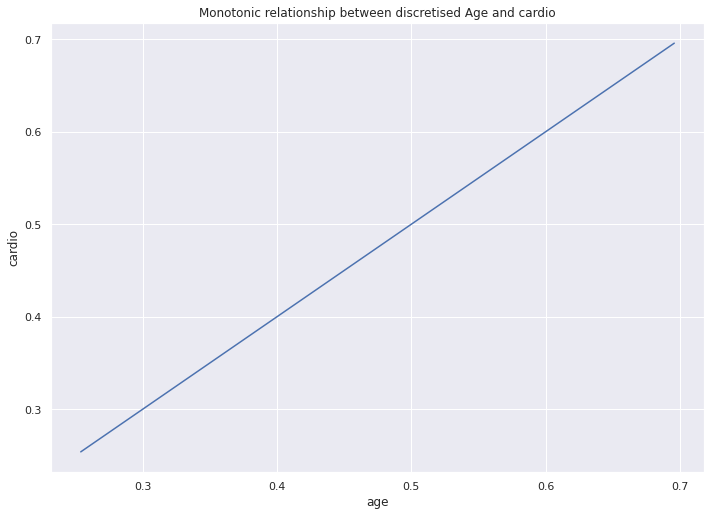

In [19]:
X_train, X_test, y_train, y_test = train_test_split(
    data[['age']],
    data['cardio'],
    test_size=0.8,
    random_state=0)

X_train.shape, X_test.shape

treeDisc = DecisionTreeDiscretiser(cv=10, scoring='roc_auc',
                                   variables=['age',],
                                   regression=False,
                                   param_grid={'max_depth': [1, 2],
                                              'min_samples_leaf':[10,4,6]})

treeDisc.fit(X_train, y_train)
treeDisc.binner_dict_['age'].best_params_


train_t = treeDisc.transform(X_train)
test_t = treeDisc.transform(X_test)

#Monotonic Relationship between Age and Cardio for Train

pd.concat([train_t, y_train], axis=1).groupby(['age'])['cardio'].mean().plot()
plt.title('Monotonic relationship between discretised Age and cardio')
plt.ylabel('cardio')


Text(0, 0.5, 'cardio')

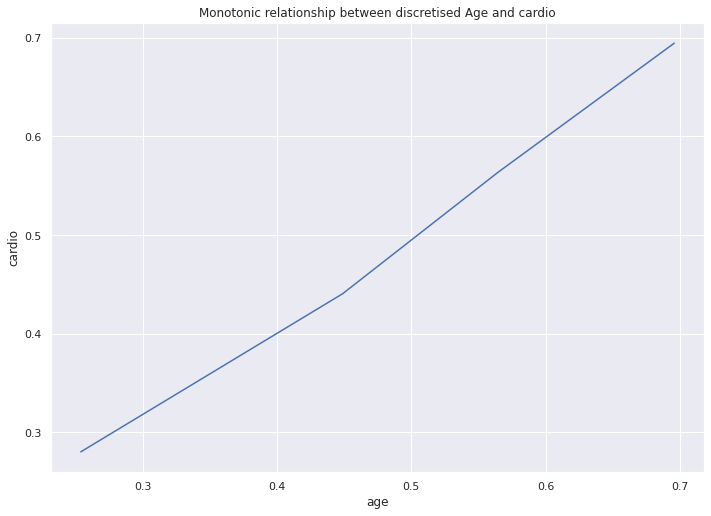

In [20]:
#Monotonic Relationship between Age and Cardio for test
pd.concat([test_t, y_test], axis=1).groupby(['age'])['cardio'].mean().plot()
plt.title('Monotonic relationship between discretised Age and cardio')
plt.ylabel('cardio')

Text(0, 0.5, 'Number of observations per bin')

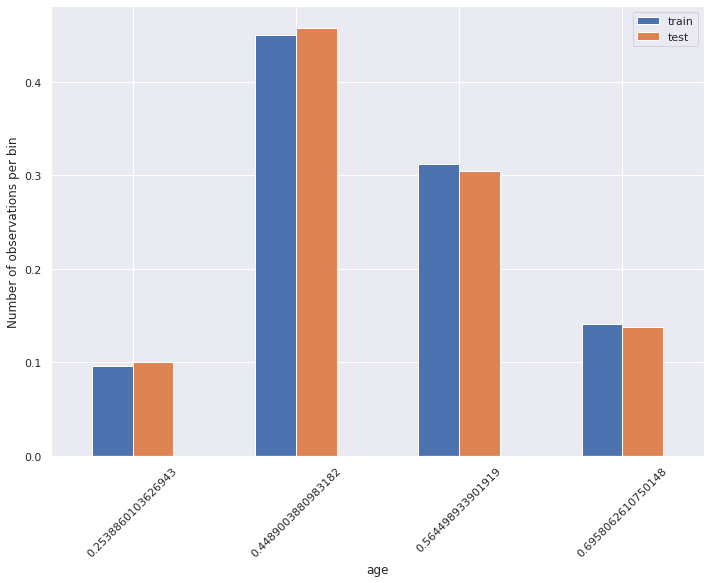

In [21]:
t1 = train_t.groupby(['age'])['age'].count() / len(train_t)
t2 = test_t.groupby(['age'])['age'].count() / len(test_t)

tmp = pd.concat([t1, t2], axis=1)
tmp.columns = ['train', 'test']
tmp.plot.bar()
plt.xticks(rotation=45)
plt.ylabel('Number of observations per bin')

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:3717: UserWarning: catplot is a figure-level function and does not accept target axes. You may wish to try barplot
  warnings.warn(msg, UserWarning)


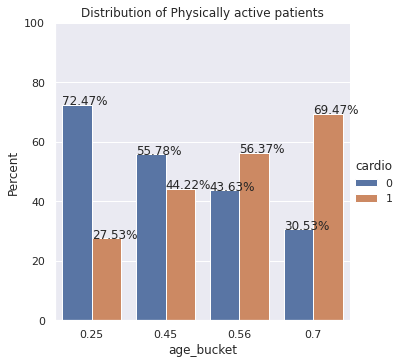

In [22]:
train=pd.concat([train_t,test_t],axis=0)
train.columns = ['age_bucket']
train['age_bucket']=train['age_bucket'].round(2)
newData=pd.concat([data,train],axis=1)


sns.set(rc={'figure.figsize':(15.7,8.27)})
x,y = 'age_bucket', 'cardio'

df1 = newData.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(ax=ax,x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
g.ax.set(ylabel="Percent",title="Distribution of Physically active patients")
for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)


**<h3>For People Age between 44-57 and 57-70 the chances of cardio vascular disease are high</h3>**

In [23]:
chi2,p,dof,ex=chiSqTest(newData,'age_bucket','cardio')
if p<0.05:
    print("There is  significant difference in Cardio Disease between patients who are from different age bucket ")
else :
     print("There is no difference in Cardio Disease between patients who are from different age bucket ")

#from statsmodels.sandbox.stats.runs import cochrans_q
#obs = newData[['gluc','cholesterol']]
#cochrans_q(obs)     

chi2 =  3130.7622745102935
p-val =  0.0
degree of freedom =  8
There is  significant difference in Cardio Disease between patients who are from different age bucket 


### **Check how BMI varies with Cardio Vascular Disease**

***Reference*** https://www.cdc.gov/healthyweight/assessing/index.html

In [24]:
'''
Reference

    If your BMI is less than 18.5, it falls within the underweight range.
    If your BMI is 18.5 to 24.9, it falls within the normal or Healthy Weight range.
    If your BMI is 25.0 to 29.9, it falls within the overweight range.
    If your BMI is 30.0 or higher, it falls within the obese range.

'''
def BMI(data):
    return data['weight'] / (data['height']/100)**2
 
newData['bmi'] = newData.apply(BMI, axis=1)


# bucket boundaries
buckets = [0, 18.5, 24.9, 29.9, 1000]

# bucket labels
labels = ['Underweight','Healthy','Overweight','Obese']

# discretisation
newData['bmi_category'] = pd.cut(
    newData['bmi'], bins=buckets, labels=labels, include_lowest=True)
newData['bmi_category'].value_counts()


Overweight     23493
Healthy        20845
Obese          15662
Underweight       71
Name: bmi_category, dtype: int64

chi2 =  1591.4570551689958
p-val =  0.0
degree of freedom =  8
There is  significant difference in Cardio Disease between patients who are from different bmi category 


/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:3717: UserWarning: catplot is a figure-level function and does not accept target axes. You may wish to try barplot
  warnings.warn(msg, UserWarning)


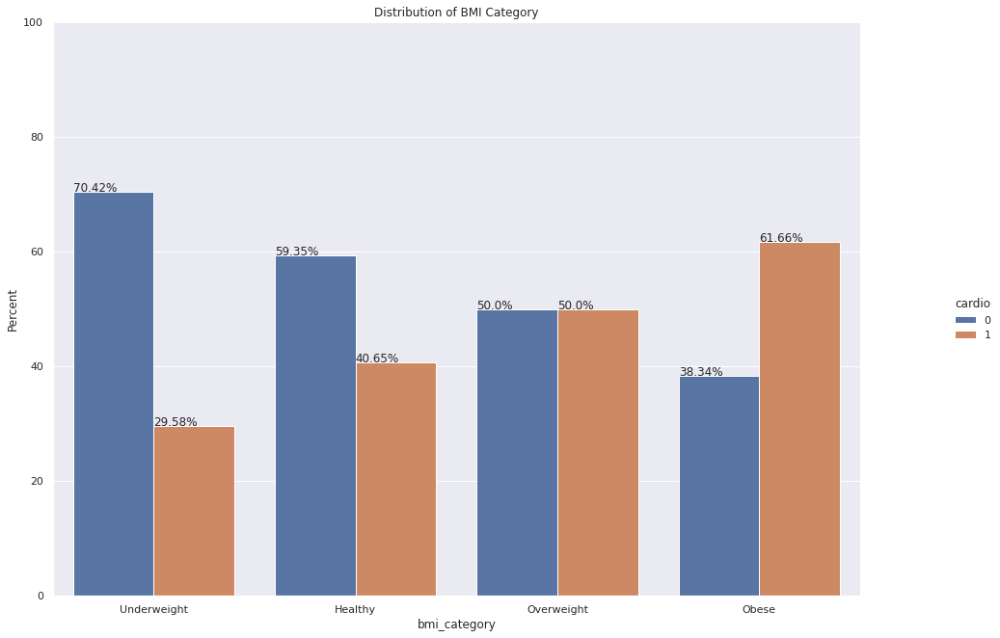

In [25]:
chi2,p,dof,ex=chiSqTest(newData,'bmi_category','cardio')
if p<0.05:
    print("There is  significant difference in Cardio Disease between patients who are from different bmi category ")
else :
     print("There is no difference in Cardio Disease between patients who are from different bmi category ")


sns.set(rc={'figure.figsize':(15.7,8.27)})
x,y = 'bmi_category', 'cardio'

df1 = newData.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(ax=ax,x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
fig = plt.gcf()
fig.set_size_inches( 16, 10)
g.ax.set(ylabel="Percent",title="Distribution of BMI Category")
for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)


**<h3> For Overweight and Obese patients the chances of Cardio Vascular Disease is High</h3>**

### **Proporation of categorical variables**

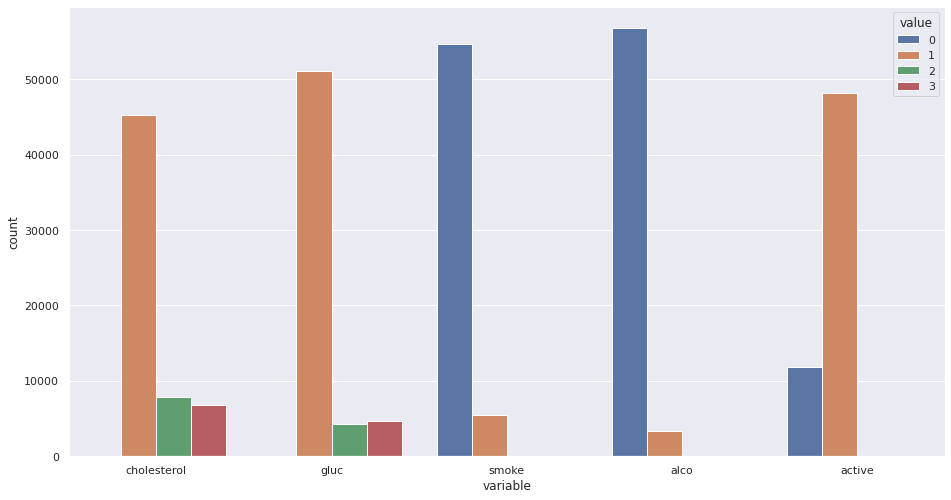

In [26]:
df_categorical = newData.loc[:,['cholesterol','gluc', 'smoke', 'alco', 'active']]
sns.countplot(x="variable", hue="value",data= pd.melt(df_categorical));


### **Checking Gender category**

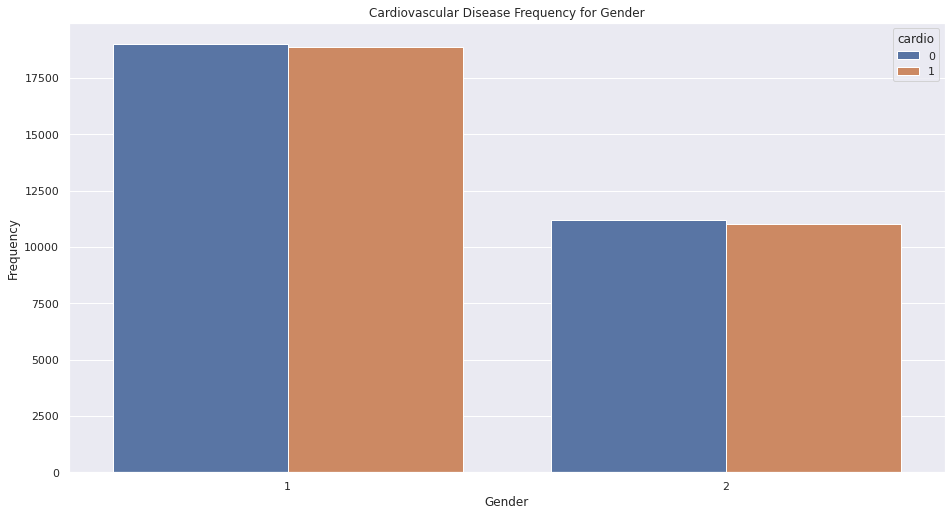

In [27]:
ax=sns.countplot(x="gender", hue="cardio",data=data)
ax.set_title('Cardiovascular Disease Frequency for Gender')
ax.set_ylabel('Frequency')
ax.set_xlabel('Gender')
plt.show()

### **Checking impact of glucose on Cardio Disease**


**<h3>Patients with higher Glucose has higher chances of cardio diseases</h3>**

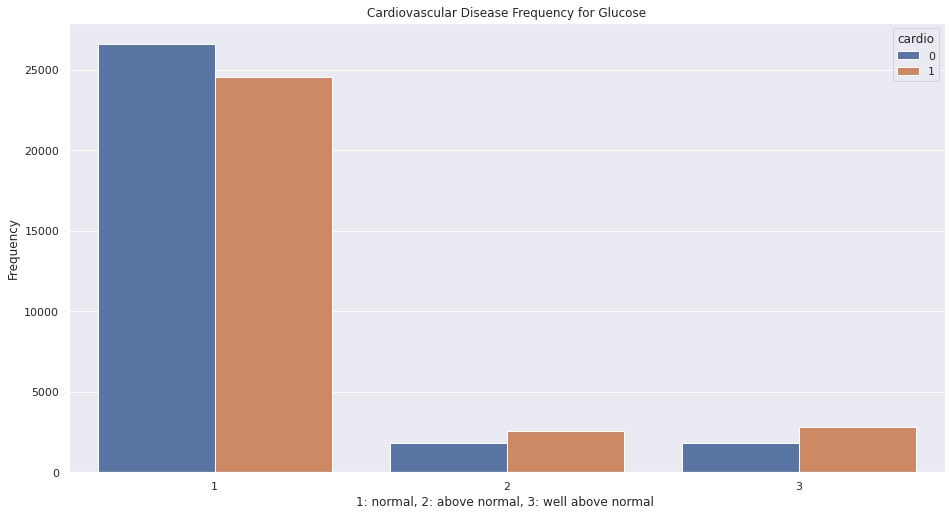

In [28]:
ax=sns.countplot(x="gluc", hue="cardio",data=newData)
ax.set_title('Cardiovascular Disease Frequency for Glucose')
ax.set_ylabel('Frequency')
ax.set_xlabel('1: normal, 2: above normal, 3: well above normal ')
plt.show()

### **Checking BloodPressure of patients**

In [135]:
from IPython.display import Image
Image(url='https://www.heart.org/-/media/health-topics-images/hbp/blood-pressure-readings-chart-english.jpg?la=en') 


In [0]:
#https://www.heart.org/en/health-topics/high-blood-pressure/understanding-blood-pressure-readings
#https://www.heart.org/-/media/health-topics-images/hbp/blood-pressure-readings-chart-english.jpg?la=en
def calculateBloodPressureLevel(data):
    if (data['ap_hi'] < 120) and (data['ap_lo'] < 80):
        return 'Normal'
    if (data['ap_hi'] >= 120 and data['ap_hi'] <=129) and (data['ap_lo'] < 80):
        return 'Elevated'
    if (data['ap_hi'] >= 130 and data['ap_hi'] <=139) | (data['ap_lo'] >= 80 and data['ap_lo'] <=89):
        return 'Stage1HyperTension'
    if (data['ap_hi'] >= 140) | (data['ap_lo'] >= 90):
        return 'Stage2HyperTension'
    if (data['ap_hi'] >= 180) | (data['ap_lo'] >= 120):
        return 'HypertensiveCrisis'

newData['blood_pressure_level'] = newData.apply(calculateBloodPressureLevel, axis=1)

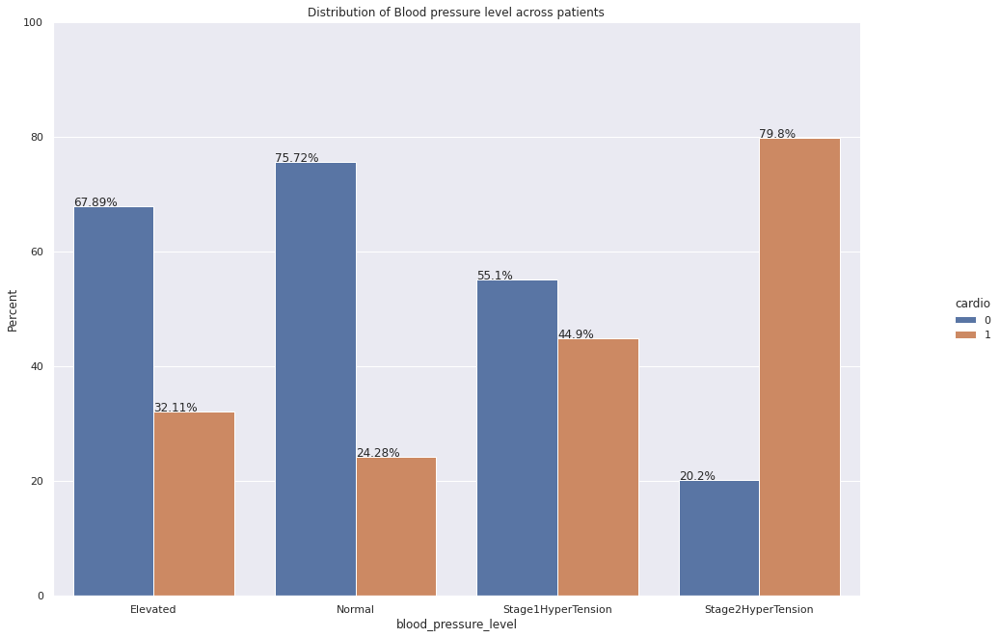

In [30]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
x,y = 'blood_pressure_level', 'cardio'

df1 = newData.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
fig = plt.gcf()
fig.set_size_inches( 16, 10)
g.ax.set(ylabel="Percent",title="Distribution of Blood pressure level across patients")

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

**<h3>HyperTension Stage 2  are more prone to cardio vascular disease</h3>**

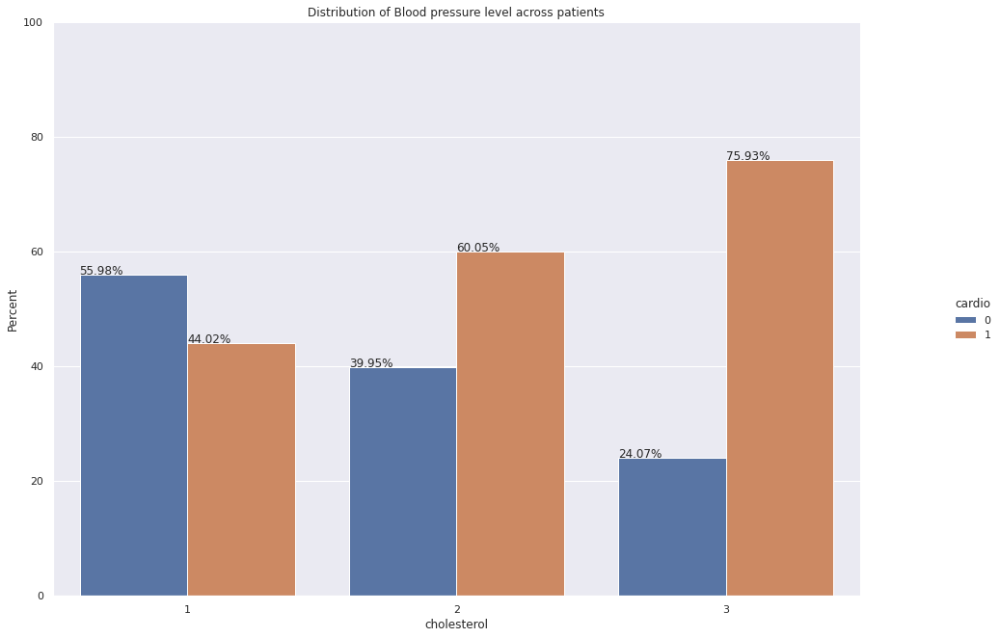

In [32]:

sns.set(rc={'figure.figsize':(11.7,8.27)})
x,y = 'cholesterol', 'cardio'

df1 = newData.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
fig = plt.gcf()
fig.set_size_inches( 16, 10)
g.ax.set(ylabel="Percent",title="Distribution of Blood pressure level across patients")

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

**<h3>Above normal cholesterol increase chances of cardio vascular disease</h3>**

### Studying Impact of distribution of  Cholesterol in across age and patients

/usr/local/lib/python3.6/dist-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


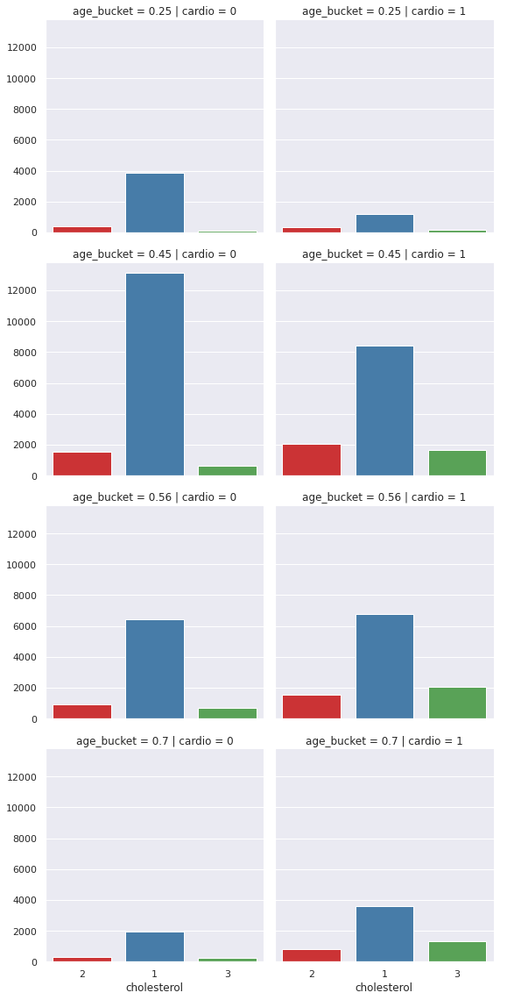

In [33]:
def countplot(x ,**kwargs):
    sns.countplot(x=x, **kwargs)

grid = sns.FacetGrid(data=newData,col='cardio',row="age_bucket",size=4,aspect=1)
fig = grid.map(countplot,'cholesterol',palette='Set1',order=newData.cholesterol.unique())
fig.add_legend()

**<h3>High Cholesterol was observered in higher age buckets of cardiovascular diseased patients</h3>**

### Studying Impact of distribution of glucose level Cholesterol levels

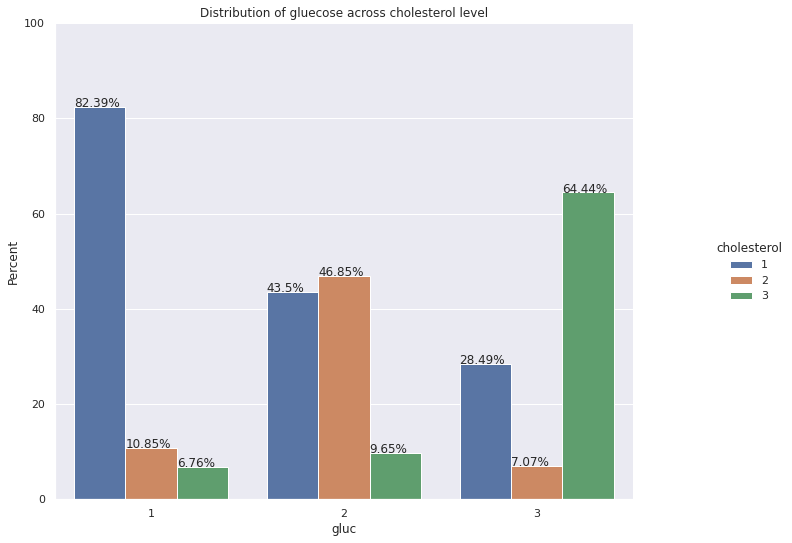

In [34]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
x,y = 'gluc', 'cholesterol'

df1 = newData.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
fig = plt.gcf()
fig.set_size_inches( 12, 8)
g.ax.set(ylabel="Percent",title="Distribution of gluecose across cholesterol level")

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

**<h3>Higher glucose level is  observered in higher cholesterol level</h3>**

### Studying distribution of smoking between patients of different gender

/usr/local/lib/python3.6/dist-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


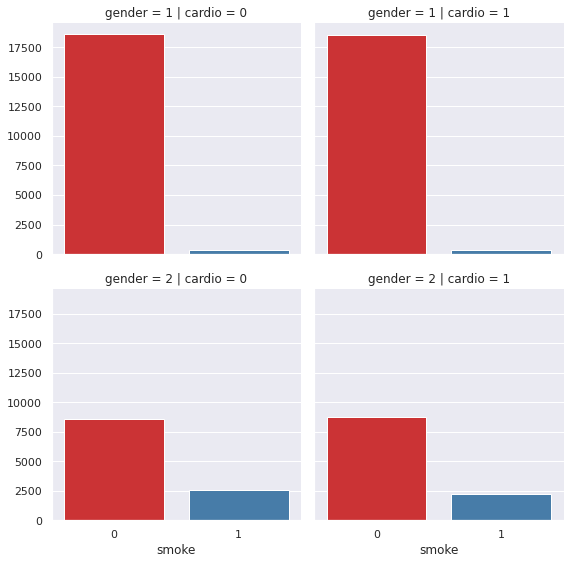

In [37]:
def countplot(x ,**kwargs):
    sns.countplot(x=x, **kwargs)

grid = sns.FacetGrid(data=newData,col='cardio',row="gender",size=4,aspect=1)
fig = grid.map(countplot,'smoke',palette='Set1',order=newData.smoke.unique())
fig.add_legend()

**<h3>Gender 2 Patients  suffering from Cardio Vascular disease tend to smoke less as compared to ones who are suffering from cvd </h3>**

/usr/local/lib/python3.6/dist-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


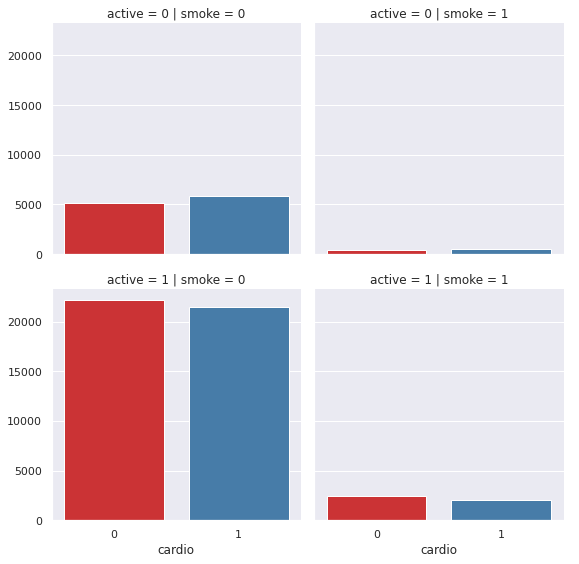

In [38]:
def countplot(x ,**kwargs):
    sns.countplot(x=x, **kwargs)

grid = sns.FacetGrid(data=newData,col='smoke',row='active',size=4,aspect=1)
fig = grid.map(countplot,'cardio',palette='Set1',order=newData.smoke.unique())
fig.add_legend()

**<h3>Patients Who work out and dont smoke slighly have lower chances of cardio vascular disease </h3>**

### **Studying Other Correlations**

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Unknown label type: 'continuous'

  FitFailedWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Unknown label type: 'continuous'

  FitFailedWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Unknown label type: 'continuous'

  FitFailedWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition f

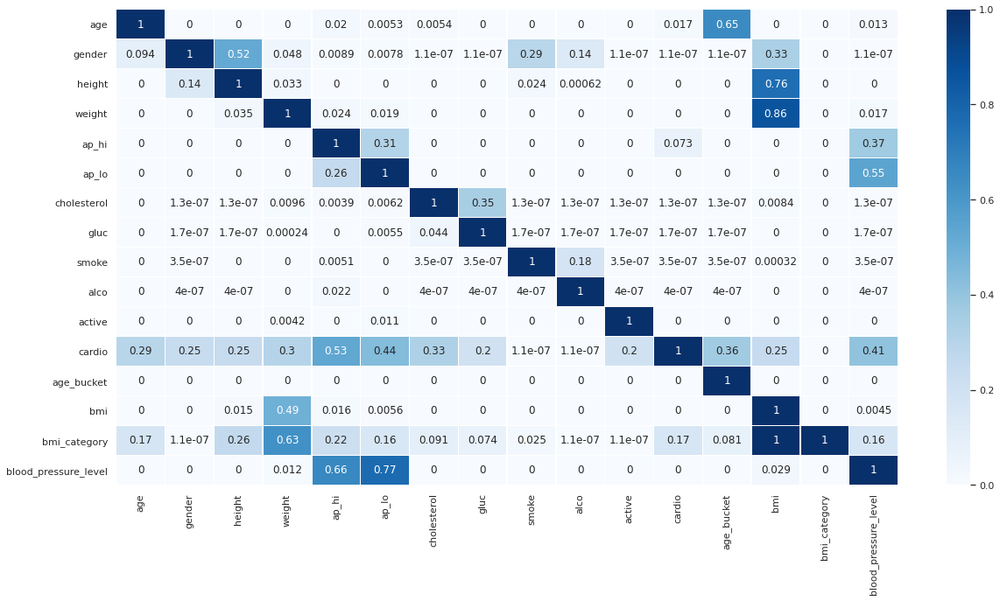

In [39]:
import seaborn as sns
import ppscore as pps
df_matrix = pps.matrix(newData)

fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(df_matrix, vmin=0, vmax=1, cmap="Blues", linewidths=0.5, annot=True)


In [40]:
pd.crosstab([newData['smoke'],newData['active']], newData['cardio'],margins=True,normalize='index')

cardio               0         1
smoke active                    
0     0       0.463788  0.536212
      1       0.508191  0.491809
1     0       0.452935  0.547065
      1       0.548614  0.451386
All           0.502306  0.497694

###**EDA Final Observations**



1. There is  significant difference in Cardio Disease between patients who  are physically active,Patients who are less active are more prone to disease </h4>

1.   Patients age between 55 and 60 have higher chances of having heart disease</h4>
2.   There is slight higher chances for Gender=1 for havin heart disease between age 54-60</h4>
3.   For People Age between 44-57 and 57-70 the chances of cardio vascular disease are high</h4>
4.   For Overweight and Obese patients the chances of Cardio Vascular Disease is High</h4>
5.   Gender 2 has higher chances of cardio diseases</h4>
6.   Patients with higher Glucose has higher chances of cardio diseases</h4>
7.   HyperTension Stage 2  are more prone to cardio vascular disease</h4>
8.   High Cholesterol was observered in higher age buckets of cardiovascular diseased patients</h4>
9.   Higher glucose level is  observered in higher cholesterol level patients</h4>
10.   Gender 2 Patients  suffering from Cardio Vascular disease tend to smoke less as compared to ones who are suffering from cvd  </h4>
11.   Patients Who work out and dont smoke slighly have lower chances of cardio vascular disease </h4>


#Predictive Modelling

###**Splitting Dataset into Train & Test**

In [0]:
newData['gender']=newData['gender'].astype('object')
newData['age']=newData['age'].astype('object')
newData['bmi_category']=newData['bmi_category'].astype('object')
newData['blood_pressure_level']=newData['blood_pressure_level'].astype('object')

X_train, X_test, y_train, y_test = train_test_split(
    newData.drop(['cardio'],axis=1), 
    data['cardio'], 
    test_size=0.2,  
    random_state=0)  


###**One Hot Encoding Gender**

In [0]:
ohe_enc = OneHotCategoricalEncoder(
    variables=['gender'], # we can select which variables to encode
    drop_last=True) # to return k-1, false to return k

ohe_enc.fit(X_train)
X_train = ohe_enc.transform(X_train)
X_test = ohe_enc.transform(X_test)



###**Ordinal Encoding age ,bmi_category Gender**

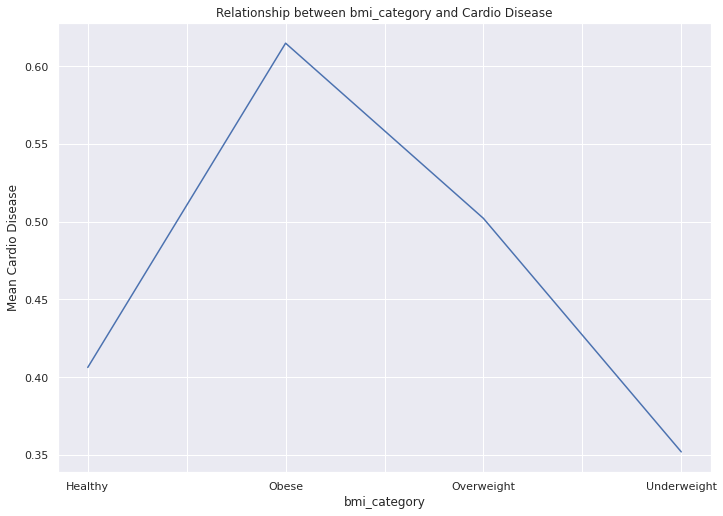

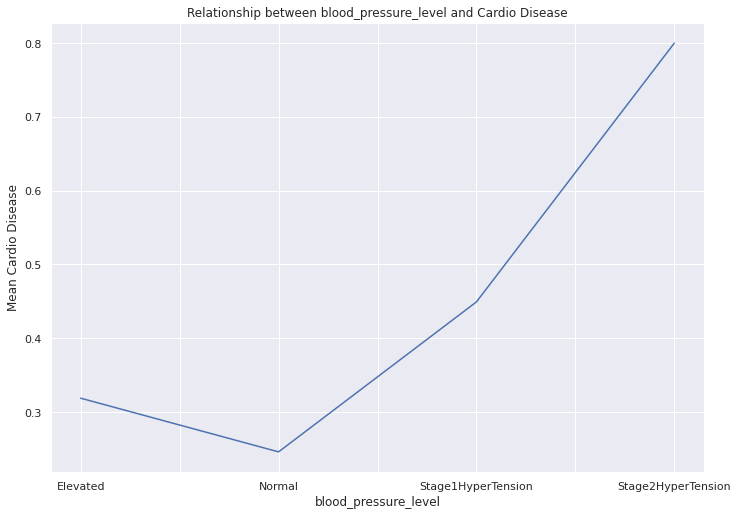

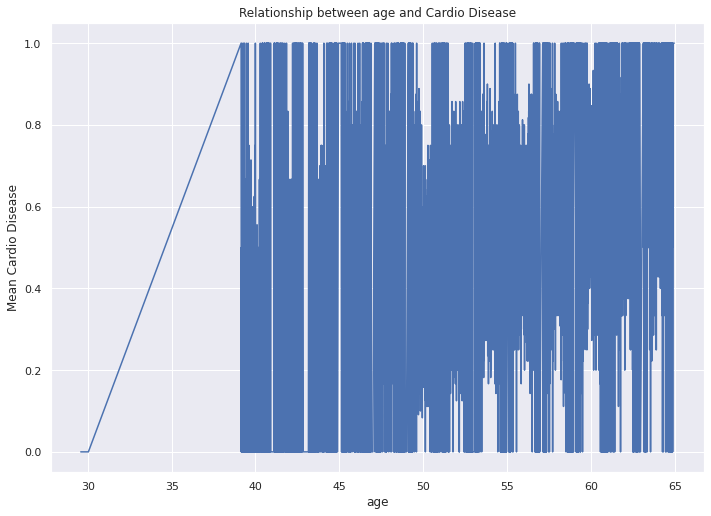

In [43]:
from feature_engine.categorical_encoders import OrdinalCategoricalEncoder

train=pd.concat([X_train,y_train],axis=1)
# let's explore the relationship of the categories with the target

for var in ['bmi_category', 'blood_pressure_level','age']:
    fig = plt.figure()
    fig = train.groupby([var])['cardio'].mean().plot()
    fig.set_title('Relationship between {} and Cardio Disease'.format(var))
    fig.set_ylabel('Mean Cardio Disease')
    plt.show()



In [44]:
ordinal_enc = OrdinalCategoricalEncoder(
    # NOTE that we indicate ordered in the encoding_method, otherwise it assings numbers arbitrarily
    encoding_method='ordered',
    variables=['bmi_category', 'blood_pressure_level','age'])


ordinal_enc.fit(X_train, y_train)
X_train_oe = ordinal_enc.transform(X_train)
X_test_oe = ordinal_enc.transform(X_test)

/usr/local/lib/python3.6/dist-packages/feature_engine/base_transformers.py:91: UserWarning: NaN values were introduced in the returned dataframe by the encoder.This means that some of the categories in the input dataframe were not present in the training set used when the fit method was called. Thus, mappings for those categories does not exist. Try using the RareLabelCategoricalEncoder to remove infrequent categories before calling this encoder.
  "NaN values were introduced in the returned dataframe by the encoder."


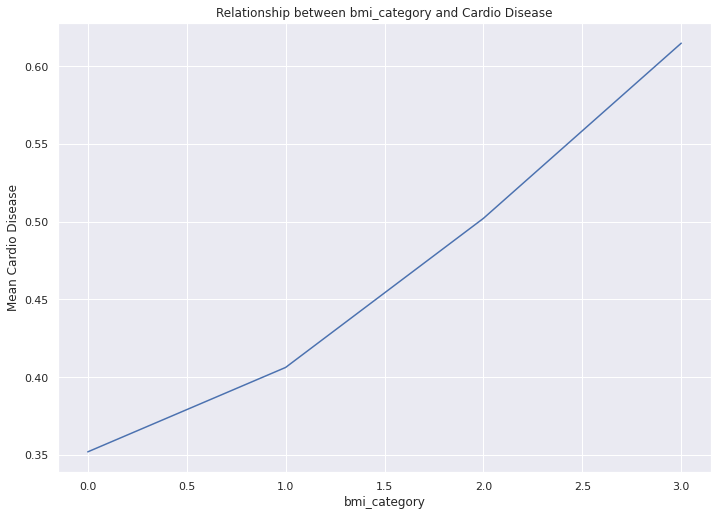

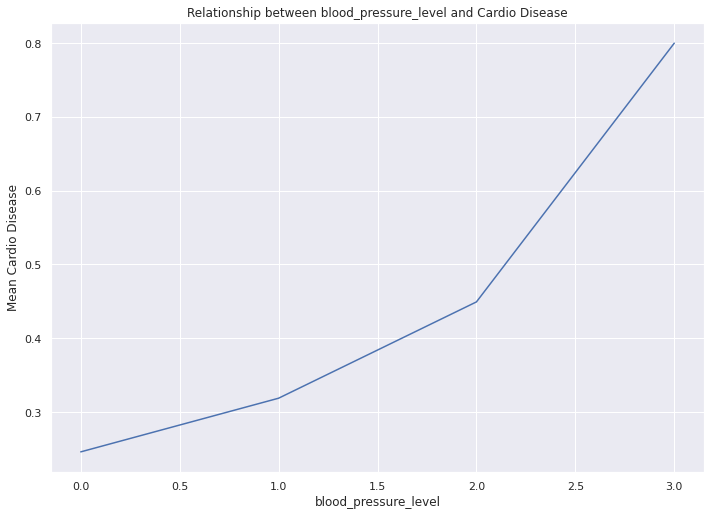

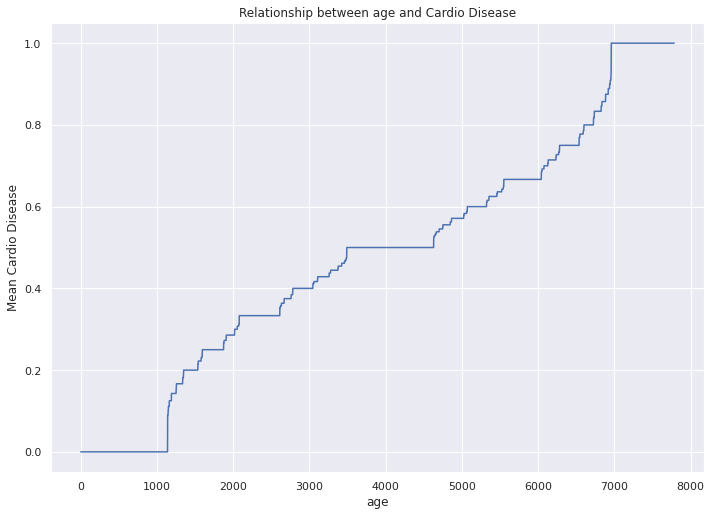

In [45]:
from feature_engine.categorical_encoders import OrdinalCategoricalEncoder

train=pd.concat([X_train_oe,y_train],axis=1)
# let's explore the relationship of the categories with the target

for var in ['bmi_category', 'blood_pressure_level','age']:
    fig = plt.figure()
    fig = train.groupby([var])['cardio'].mean().plot()
    fig.set_title('Relationship between {} and Cardio Disease'.format(var))
    fig.set_ylabel('Mean Cardio Disease')
    plt.show()



**<h3> Montonic Relationship developed between age,mean cardio disease, bmi_category and mean cardio disease & blood_pressure_level and mean cardio disease<h3>**


###**JamesStien Encoding age ,bmi_category Gender**

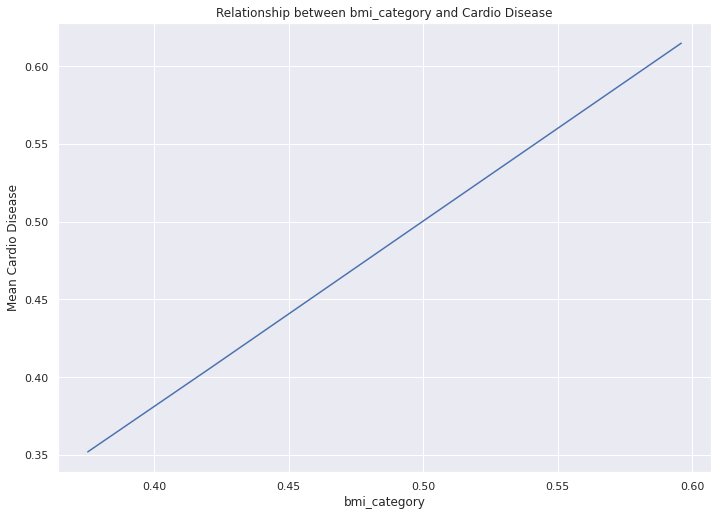

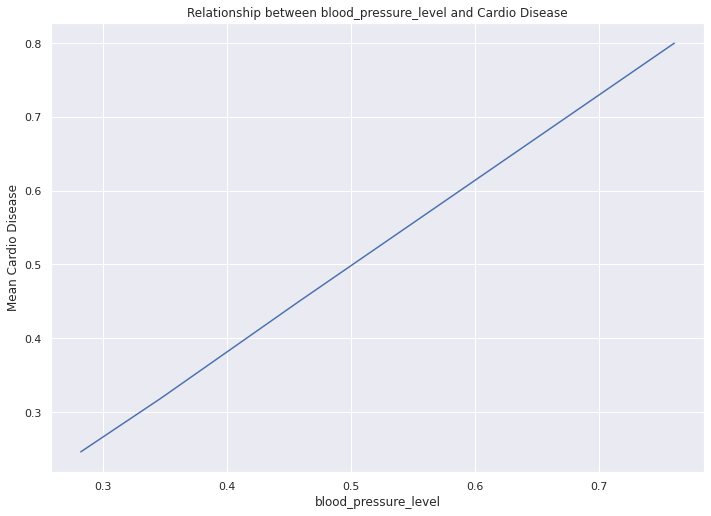

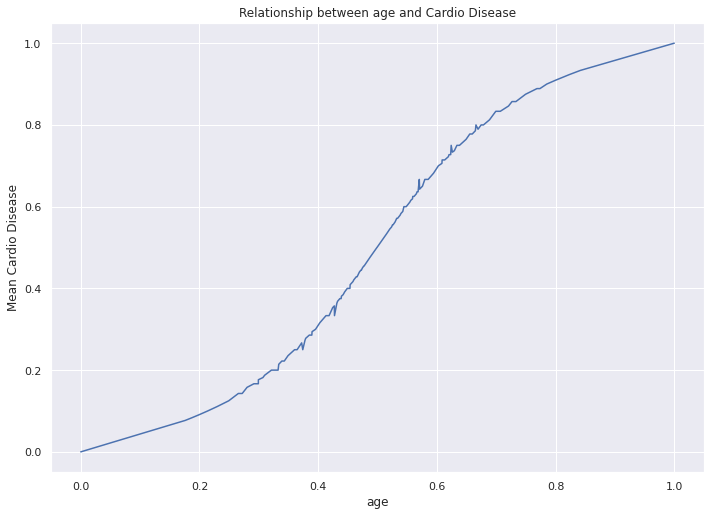

In [46]:
import category_encoders as ce
encoder = ce.JamesSteinEncoder(cols=['bmi_category', 'blood_pressure_level','age'])
encoder.fit(X_train,y_train)
X_train_JamesSteinEncoded=encoder.transform(X_train)
X_test_JamesSteinEncoded=encoder.transform(X_test)
X_train_JamesSteinEncoded.head()
train=pd.concat([X_train_JamesSteinEncoded,y_train],axis=1)
# let's explore the relationship of the categories with the target

for var in ['bmi_category', 'blood_pressure_level','age']:
    fig = plt.figure()
    fig = train.groupby([var])['cardio'].mean().plot()
    fig.set_title('Relationship between {} and Cardio Disease'.format(var))
    fig.set_ylabel('Mean Cardio Disease')
    plt.show()


### SpotChecking Classification Algorithms

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


 >KNN 0.715 (0.008) 
 >NC 0.696 (0.007) 
 >LGBM 0.747 (0.008) 
 >LR 0.746 (0.006) 
 >LRCV 0.745 (0.006) 
 >BNB 0.677 (0.007) 
 >GNB 0.664 (0.006) 
 >DT 0.674 (0.013) 
 >PR 0.732 (0.042) 
 >SGD 0.728 (0.011) 
 >RC 0.727 (0.007) 
 >RCCV 0.727 (0.007) 
 >PC 0.673 (0.093) 


/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


 >RF 0.744 (0.006) 
 >XGBoost 0.747 (0.007) 
 >ExtraTrees 0.734 (0.006) 
 >catboost 0.748 (0.006) 


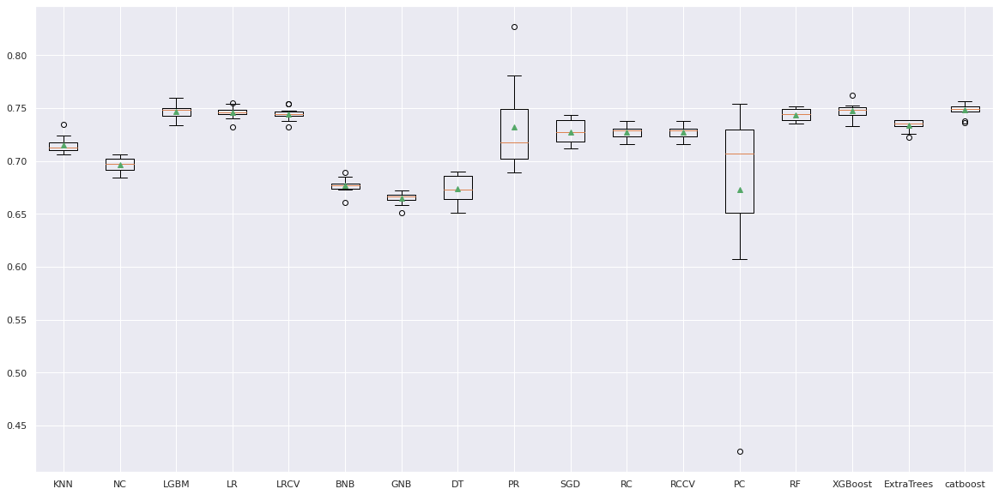

In [47]:
import lightgbm as lgbm
from lightgbm import LGBMClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import fbeta_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import make_scorer
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.metrics import cohen_kappa_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.linear_model import LogisticRegressionCV
from sklearn.linear_model import RidgeClassifierCV
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import Perceptron
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC
from sklearn.svm import NuSVC
from sklearn.svm import SVC

from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid

# evaluate a model
def evaluate_model(X, y, model):
  # define evaluation procedure
  cv = KFold(n_splits=10,  random_state=1)
  # define the model evaluation metric
  metric = make_scorer(fbeta_score,pos_label=1,beta=2)
  # evaluate model
  scores = cross_val_score(model, X, y, scoring=metric, cv=cv, n_jobs=-1)
  return scores

def get_models():
  models, names = list(), list()

  KNN=[('Standardized',StandardScaler()),('KNN',KNeighborsClassifier())]
  models.append(KNN)
  names.append( 'KNN' )

  NC=[('Standardized',StandardScaler()),('NC',NearestCentroid())]
  models.append(NC)
  names.append( 'NC' )

  LGBM=[('Standardized',StandardScaler()),('LGBM',LGBMClassifier())]
  models.append(LGBM)
  names.append( 'LGBM' )

  LR=[('Standardized',StandardScaler()),('LR',LogisticRegression(solver= 'lbfgs'))]
  models.append(LR)
  names.append( 'LR' )
  
  LRCV=[('Standardized',StandardScaler()),('LRCV',LogisticRegressionCV())]
  models.append(LRCV)
  names.append( 'LRCV' )

  BNB=[('Standardized',StandardScaler()),('BNB',BernoulliNB())]
  models.append(BNB)
  names.append( 'BNB' )

  GNB=[('Standardized',StandardScaler()),('GNB',GaussianNB())]
  models.append(GNB)
  names.append( 'GNB' )

  NSVC=[('Standardized',StandardScaler()),('NSVC',NuSVC())]
  #models.append(NSVC)
  #names.append( 'NSVC' )

  LSVC=[('Standardized',StandardScaler()),('LSVC',LinearSVC())]
  #models.append(LSVC)
  #names.append( 'LSVC' )

  CSVC=[('Standardized',StandardScaler()),('CSVC',SVC())]
  #models.append(CSVC)
  #names.append( 'CSVC' )


  DT=[('Standardized',StandardScaler()),('DT',DecisionTreeClassifier())]
  models.append(DT)
  names.append( 'DT' )

  PR=[('Standardized',StandardScaler()),('PR',Perceptron())]
  models.append(PR)
  names.append( 'PR' )

  SGD=[('Standardized',StandardScaler()),('SGD',SGDClassifier())]
  models.append(SGD)
  names.append( 'SGD' )

  RC=[('Standardized',StandardScaler()),('RC',RidgeClassifier())]
  models.append(RC)
  names.append( 'RC' )

  RCCV=[('Standardized',StandardScaler()),('RCCV',RidgeClassifierCV())]
  models.append(RCCV)
  names.append( 'RCCV' )

  PC=[('Standardized',StandardScaler()),('PC',PassiveAggressiveClassifier())]
  models.append(PC)
  names.append( 'PC' )

  RF=[('Standardized',StandardScaler()),('STRF',RandomForestClassifier())]
  models.append(RF)
  names.append( 'RF')

  XGBoost=[('Standardized',StandardScaler()),('XgBoost',XGBClassifier())]
  models.append(XGBoost)
  names.append( 'XGBoost' )

  ExtraTrees=[('Standardized',StandardScaler()),('ExtraTrees',ExtraTreesClassifier())]
  models.append(ExtraTrees)
  names.append( 'ExtraTrees' )

  catboost=[('Standardized',StandardScaler()),('catboost',CatBoostClassifier())]
  models.append(catboost)
  names.append( 'catboost' )

  return models, names


# define models
models, names = get_models()
results = list()
# evaluate each model
for i in range(len(models)):
  # create a pipeline
  steps = models[i]
  pipeline = Pipeline(steps=steps)
  # evaluate the model and store results
  scores = evaluate_model(X_train_JamesSteinEncoded, y_train, pipeline)
  results.append(scores)
  # summarize and store 
  print( ' >%s %.3f (%.3f) ' % (names[i], np.mean(scores), np.std(scores)))
# plot the results

fig, ax = plt.subplots(1, 1, figsize=(20,10))
plt.boxplot(results, labels=names, showmeans=True)
plt.show()



In [48]:
for i in range(len(results)):
  print( 'Model : %s (mean): %.3f (median): %.3f (std): (%.3f) ' % (names[i], np.mean(results[i]),np.median(results[i]), np.std(results[i])))


Model : KNN (mean): 0.715 (median): 0.713 (std): (0.008) 
Model : NC (mean): 0.696 (median): 0.697 (std): (0.007) 
Model : LGBM (mean): 0.747 (median): 0.749 (std): (0.008) 
Model : LR (mean): 0.746 (median): 0.746 (std): (0.006) 
Model : LRCV (mean): 0.745 (median): 0.744 (std): (0.006) 
Model : BNB (mean): 0.677 (median): 0.677 (std): (0.007) 
Model : GNB (mean): 0.664 (median): 0.666 (std): (0.006) 
Model : DT (mean): 0.674 (median): 0.673 (std): (0.013) 
Model : PR (mean): 0.732 (median): 0.718 (std): (0.042) 
Model : SGD (mean): 0.728 (median): 0.728 (std): (0.011) 
Model : RC (mean): 0.727 (median): 0.729 (std): (0.007) 
Model : RCCV (mean): 0.727 (median): 0.729 (std): (0.007) 
Model : PC (mean): 0.673 (median): 0.707 (std): (0.093) 
Model : RF (mean): 0.744 (median): 0.744 (std): (0.006) 
Model : XGBoost (mean): 0.747 (median): 0.748 (std): (0.007) 
Model : ExtraTrees (mean): 0.734 (median): 0.735 (std): (0.006) 
Model : catboost (mean): 0.748 (median): 0.749 (std): (0.006) 


### Hyperparameter Tuning Catboost using Bayesian Optimization

**<h4>Since catboost has reasonably many hyperparameters,every hyperaparameter will have google sample space of values to search on,To avoid exhaustive grid search,we will go for Bayesian Optimization that can achieve reasonably google set of optimal parameters from sample space of values</h4>**

In [0]:
from time import time 
from skopt import BayesSearchCV
from skopt.callbacks import DeadlineStopper, VerboseCallback, DeltaXStopper
from skopt.space import Real, Categorical, Integer
from catboost import Pool, CatBoostClassifier
from catboost.utils import get_confusion_matrix


model = CatBoostClassifier(task_type = "GPU",verbose=True)

model.fit(X_train_JamesSteinEncoded), y_train)

ypred=model.predict(X_test_JamesSteinEncoded)
cm = get_confusion_matrix(model, Pool(X_test_JamesSteinEncoded), y_test))
f2_score_all = fbeta_score(y_test, ypred,beta=2)
print(f2_score_all)
print(cm)


# get feature name and importance
features = pd.Series(model.feature_importances_)
features.index = X_train_JamesSteinEncoded.columns

# sort the features by importance
features.sort_values(ascending=True, inplace=True)

# plot
features.plot.bar(figsize=(20,6))



In [49]:

# Reporting util for different optimizers

def report_perf(optimizer, X, y, title, callbacks=None):
    """
    A wrapper for measuring time and performances of different optmizers
    
    optimizer = a sklearn or a skopt optimizer
    X = the training set 
    y = our target
    title = a string label for the experiment
    """
    start = time()
    if callbacks:
        optimizer.fit(X, y, callback=callbacks)
    else:
        optimizer.fit(X, y)
    d=pd.DataFrame(optimizer.cv_results_)
    best_score = optimizer.best_score_
    best_score_std = d.iloc[optimizer.best_index_].std_test_score
    best_params = optimizer.best_params_
    print((title + " took %.2f seconds,  candidates checked: %d, best CV score: %.3f "
           +u"\u00B1"+" %.3f") % (time() - start, 
                                  len(optimizer.cv_results_['params']),
                                  best_score,
                                  best_score_std))    
    print('Best parameters:')
    print(best_params)
    print()
    return best_params

#F2Score since we want to minimize False Negatives
f2sscore = make_scorer(fbeta_score,pos_label=1,beta=2)
'''
[[5317. 1595.]
 [2054. 4895.]]
 '''

'\n[[5317. 1595.]\n [2054. 4895.]]\n '

### Feature Selection using Recursive Feature Elimination 

In [0]:
features = list(features.index)

print('doing recursive feature elimination')

features_to_remove = []
count = 1

for feature in features:
    print()
    print('testing feature: ', feature, ' which is feature ', count,
          ' out of ', len(features))
    count = count + 1
    model = CatBoostClassifier(task_type = "GPU",verbose=True)
    model.fit(
        X_train_JamesSteinEncoded.drop(features_to_remove + [feature], axis=1), y_train)
    y_pred_test = model.predict(
        X_test_JamesSteinEncoded.drop(features_to_remove + [feature], axis=1))

    f2Score = fbeta_score(y_test, y_pred_test,beta=2)
    print('New Test f2Score ={}'.format((f2Score)))

    print('All features Test F2={}'.format((f2_score_all)))

    diff_f2= f2_score_all - f2Score
    if diff_f2 >= tol:
        print('Drop in F2 score ={}'.format(diff_f2))
        print('keep: ', feature)
        print
    else:
        print('Drop in F2 ={}'.format(diff_f2))
        print('remove: ', feature)
        print
        # if the drop in the roc is small and we remove the
        # feature, we need to set the new roc to the one based on
        # the remaining features
        f2_score_all = f2Score
        
        # and append the feature to remove to the collecting
        # list
        features_to_remove.append(feature)

# now the loop is finished, we evaluated all the features
print('DONE!!')
print('total features to remove: ', len(features_to_remove))

# determine the features to keep (those we won't remove)
features_to_keep = [x for x in features if x not in features_to_remove]
print('total features to keep: ', len(features_to_keep))

In [108]:
model.fit(X_train_JamesSteinEncoded[features_to_keep], y_train)

ypred=model.predict(X_test_JamesSteinEncoded[features_to_keep])
cm = get_confusion_matrix(model, Pool(X_test_JamesSteinEncoded[features_to_keep], y_test))
f2_score_all = fbeta_score(y_test, ypred,beta=2)
print(f2_score_all)
print(cm)
#['gender_1','alco','active','blood_pressure_level','ap_lo','weight','bmi','age_bucket','cholesterol','ap_hi']
#features_to_keep

# Defining your search space
search_spaces = {'iterations': Integer(10, 300),
                 'depth': Integer(1, 8),
                 'learning_rate': Real(0.01, 1.0, 'log-uniform'),
                 'random_strength': Real(1e-9, 10, 'log-uniform'),
                 'bagging_temperature': Real(0.0, 1.0),
                 'border_count': Integer(1, 255),
                 'l2_leaf_reg': Integer(2, 30),
                 'scale_pos_weight':Real(0.01, 1.0, 'uniform')
                
                }

# Setting up BayesSearchCV
opt = BayesSearchCV(model,
                    search_spaces,
                    scoring=f2sscore,
                    cv=KFold(n_splits=10,  random_state=1),
                    n_iter=100,
                    n_jobs=1,  # use just 1 job with CatBoost in order to avoid segmentation fault
                    return_train_score=False,
                    optimizer_kwargs={'base_estimator': 'GBRT'},
                    random_state=42)

best_params = report_perf(opt, X_train_JamesSteinEncoded.drop(['age'],axis=1), y_train,'CatBoost', 
                           callbacks=[VerboseCallback(100), 
                                      DeadlineStopper(60*10)])

mBestparams=[]
for baseEstimator in ['GP', 'RF', 'ET', 'GBRT']:
    opt = BayesSearchCV(model,
                        search_spaces,
                        scoring=f2sscore,
                        cv=KFold(n_splits=10,  random_state=1),
                        n_iter=100,
                        n_jobs=1,
                        return_train_score=False,
                        optimizer_kwargs={'base_estimator': baseEstimator},
                        random_state=4)
    best_params = report_perf(opt, X_train_JamesSteinEncoded, y_train,'CatBoost', 
                           callbacks=[VerboseCallback(100), 
                                      DeadlineStopper(60*10)])
    mBestparams.append(best_params)



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


Streaming output truncated to the last 5000 lines.
244:	learn: 0.5599839	total: 733ms	remaining: 44.9ms
245:	learn: 0.5599353	total: 736ms	remaining: 41.9ms
246:	learn: 0.5598887	total: 739ms	remaining: 38.9ms
247:	learn: 0.5598399	total: 742ms	remaining: 35.9ms
248:	learn: 0.5597847	total: 744ms	remaining: 32.9ms
249:	learn: 0.5597426	total: 747ms	remaining: 29.9ms
250:	learn: 0.5596947	total: 750ms	remaining: 26.9ms
251:	learn: 0.5596523	total: 753ms	remaining: 23.9ms
252:	learn: 0.5596051	total: 756ms	remaining: 20.9ms
253:	learn: 0.5595593	total: 759ms	remaining: 17.9ms
254:	learn: 0.5595132	total: 761ms	remaining: 14.9ms
255:	learn: 0.5594712	total: 764ms	remaining: 11.9ms
256:	learn: 0.5594299	total: 767ms	remaining: 8.95ms
257:	learn: 0.5593893	total: 770ms	remaining: 5.97ms
258:	learn: 0.5593471	total: 773ms	remaining: 2.98ms
259:	learn: 0.5593006	total: 776ms	remaining: 0us
0:	learn: 0.6902972	total: 3.72ms	remaining: 963ms
1:	learn: 0.6875244	total: 6.63ms	remaining: 855ms
2:

In [126]:
'''
for best_params in mBestparams:pool = Pool(X, y, cat_features=cat_features_index, feature_names=list(X.columns))
  print(best_params)
  tuned_model = CatBoostClassifier(**best_params,task_type = "GPU",od_type='Iter')
  tuned_model.fit(X_train_JamesSteinEncoded,y_train)
  yHat=tuned_model.predict(X_test_JamesSteinEncoded)
  cm = get_confusion_matrix(model, Pool(X_test_JamesSteinEncoded, y_test))
  print(cm)
'''

#aTrain=X_train_JamesSteinEncoded.drop(['age'],axis=1)
#aTest=X_test_JamesSteinEncoded.drop(['age'],axis=1)

aTrain=X_train_JamesSteinEncoded[features_to_keep]
aTest=X_test_JamesSteinEncoded[features_to_keep]

tuned_model = CatBoostClassifier(**best_params,task_type = "GPU",od_type='Iter',verbose=0)
tuned_model.fit(aTrain,y_train)

f2_score_all = fbeta_score(y_test, ypred,beta=2)
print(f2_score_all)


#print(fbeta_score(cm['Actual'],cm['Predict'],beta=2))

cm = get_confusion_matrix(tuned_model, Pool(aTest, y_test))
print(cm)



feature_score = pd.DataFrame(list(zip(aTrain.dtypes.index, tuned_model.get_feature_importance(Pool(aTrain, label=y_train)))),
                columns=['Feature','Score'])
feature_score = feature_score.sort_values(by='Score', ascending=False, inplace=False, kind='quicksort', na_position='last')

[[4617. 1442.]
 [1879. 4077.]]


###Feature Importance of Model

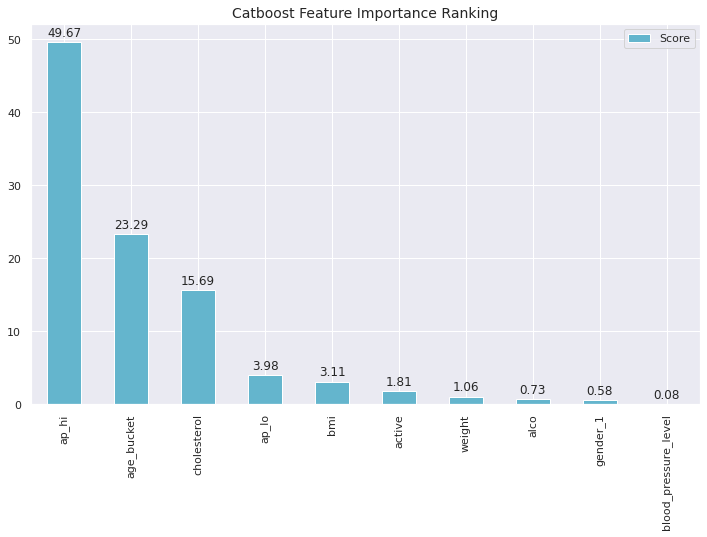

In [127]:
plt.rcParams["figure.figsize"] = (12,7)
ax = feature_score.plot('Feature', 'Score', kind='bar', color='c')
ax.set_title("Catboost Feature Importance Ranking", fontsize = 14)
ax.set_xlabel('')

rects = ax.patches

# get feature score as labels round to 2 decimal
labels = feature_score['Score'].round(2)

for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 0.35, label, ha='center', va='bottom')

plt.show()

### Optimize for F2 Score

In [128]:
cm = pd.DataFrame()
cm['Actual'] = y_test
cm['Predict'] = tuned_model.predict(X_test_JamesSteinEncoded)
print(pd.crosstab(cm['Actual'], cm['Predict'], margins=True)  )
print("F2 Score",fbeta_score(cm['Actual'],cm['Predict'],beta=2))



Predict     0     1    All
Actual                    
0        4617  1442   6059
1        1879  4077   5956
All      6496  5519  12015
F2 Score 0.6947142418975565


### Save the Model

In [129]:
tuned_model.save_model(
    "model.json",
    format="json"
)


!sudo cp model.json drive/Shared\ drives/ForAI/iNeuron/model.json
cm = get_confusion_matrix(tuned_model, Pool(aTest, y_test))
print(cm)


[[4617. 1442.]
 [1879. 4077.]]


### Calibration of Probablities,Since Doctor might needs to be sure of the disease

In [130]:
from sklearn.calibration import CalibratedClassifierCV

from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc

model_isotonic = CalibratedClassifierCV(tuned_model, cv=5, method='sigmoid')
model_isotonic.fit(aTrain, y_train)


CalibratedClassifierCV(base_estimator=<catboost.core.CatBoostClassifier object at 0x7fbf6ae24470>,
                       cv=5, method='sigmoid')

###Saving Calibrated Model 

In [0]:

from sklearn.externals import joblib
joblib_file = "joblib_catboost_Model.pkl"  
joblib.dump(model_isotonic, joblib_file)

catboost_calibrated_model = joblib.load(joblib_file)

!sudo cp joblib_catboost_Model.pkl drive/Shared\ drives/ForAI/iNeuron/joblib_catboost_Model.pkl

catboost_calibrated_model

### Plot Precision Recall Curve, Higher recall is what we need

Skill PR AUC: 0.774 


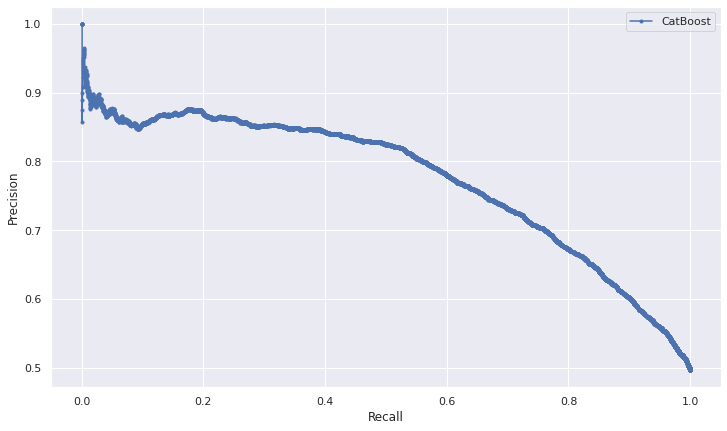

In [133]:
yhat = catboost_calibrated_model.predict_proba(aTest)
pos_probs = yhat[:, 1]
# calculate the precision-recall auc
precision, recall, _ = precision_recall_curve(y_test, pos_probs)
auc_score = auc(recall, precision)
print( 'Skill PR AUC: %.3f ' % auc_score)
# plot the model precision-recall curve
plt.plot(recall, precision, marker= '.' , label= 'CatBoost' )
# axis labels
plt.xlabel('Recall' )
plt.ylabel('Precision')

# show the legend
plt.legend()
# show the plot
plt.show()

In [134]:

from numpy import argmax
import numpy as np
from sklearn.metrics import fbeta_score
yhat = catboost_calibrated_model.predict_proba(aTest)

yhatPred = catboost_calibrated_model.predict(aTest)

pos_probs = yhat[:, 1]
# calculate the precision-recall auc
precision, recall, thresholds = precision_recall_curve(y_test, pos_probs)
auc_score = auc(recall, precision)
print( 'Skill PR AUC: %.3f ' % auc_score)


Skill PR AUC: 0.774 


### Optimizing the threshold for higher recall

In [0]:
def plot_precision_recall_vs_threshold(precisions, recalls, thresholds):
    plt.figure(figsize=(8, 8))
    plt.title("Precision and Recall Scores as a function of the decision threshold")
    plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
    plt.plot(thresholds, recalls[:-1], "g-", label="Recall")
    plt.ylabel("Score")
    plt.xlabel("Decision Threshold")
    plt.legend(loc='best')

In [0]:
from sklearn.metrics import confusion_matrix
def adjusted_classes(y_scores, t):
    """
    This function adjusts class predictions based on the prediction threshold (t).
    Will only work for binary classification problems.
    """
    return [1 if y >= t else 0 for y in pos_probs]

def precision_recall_threshold(p, r, thresholds, t=0.5):
    """
    plots the precision recall curve and shows the current value for each
    by identifying the classifier's threshold (t).
    """
    
    # generate new class predictions based on the adjusted_classes
    # function above and view the resulting confusion matrix.
    y_pred_adj = adjusted_classes(pos_probs, t)
    print(pd.DataFrame(confusion_matrix(y_test, y_pred_adj),
                       columns=['pred_pos', 'pred_neg'], 
                       index=['pos', 'neg']))
    
    # plot the curve
    plt.figure(figsize=(8,8))
    plt.title("Precision and Recall curve ^ = current threshold")
    plt.step(r, p, color='b', alpha=0.2,
             where='post')
    plt.fill_between(r, p, step='post', alpha=0.2,
                     color='b')
    plt.ylim([0.5, 1.01]);
    plt.xlim([0.5, 1.01]);
    plt.xlabel('Recall');
    plt.ylabel('Precision');
    
    # plot the current threshold on the line
    close_default_clf = np.argmin(np.abs(thresholds - t))
    plt.plot(r[close_default_clf], p[close_default_clf], '^', c='k',
            markersize=15)

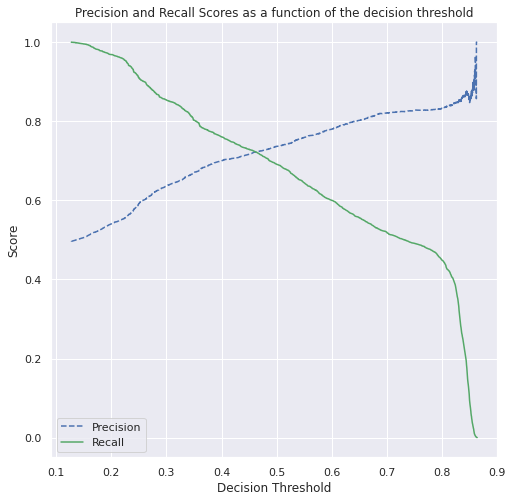

In [137]:
plot_precision_recall_vs_threshold(precision, recall, thresholds)

 Threshold=0.133, F2-measure=0.90822 
     pred_pos  pred_neg
pos        70      5989
neg         3      5953


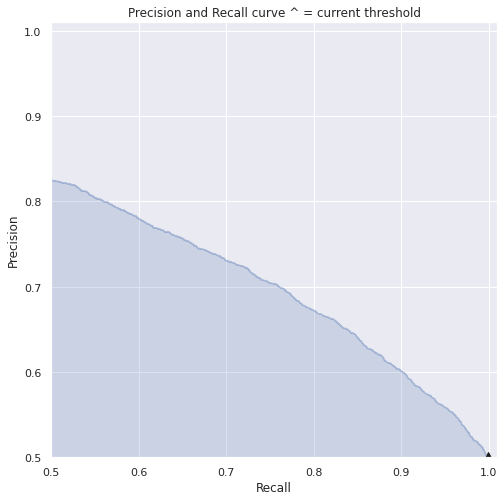

In [138]:
thresh = np.arange(0, 1, 0.001)

def to_labels(pos_probs, threshold):
  return (pos_probs >= threshold).astype( 'int' )

scores = [fbeta_score(y_test, to_labels(pos_probs, t),beta=3) for t in thresholds]
ix = argmax(scores)
print( ' Threshold=%.3f, F2-measure=%.5f ' % (thresholds[ix], scores[ix]))


precision_recall_threshold(precision,recall,thresholds,thresholds[ix])

**<h3>Although Best threshold is 13%, we can take 20% chance patients not having Cardio disease, if the probablity of having CVD is slightly more than 20 we will mark it as Cardio Disease Patient, at the the end of the day we want our patients to be healthy </h3>**

In [139]:
#As per Best Threshold
cm = pd.DataFrame()
cm['Actual'] = y_test
cm['Predict'] =  [1 if y >=thresholds[ix] else 0 for y in pos_probs]
pd.crosstab(cm['Actual'], cm['Predict'], margins=True)  



Predict,0,1,All
Actual,,,
0,70,5989,6059
1,3,5953,5956
All,73,11942,12015


In [144]:
#Chosen One 30% Threshold
cm = pd.DataFrame()
cm['Actual'] = y_test
cm['Predict'] =  [1 if y >=0.3 else 0 for y in pos_probs]
pd.crosstab(cm['Actual'], cm['Predict'], margins=True)  



Predict,0,1,All
Actual,,,
0,3153,2906,6059
1,870,5086,5956
All,4023,7992,12015


###Chosen Threshold (30% Risk)

     pred_pos  pred_neg
pos      3153      2906
neg       870      5086


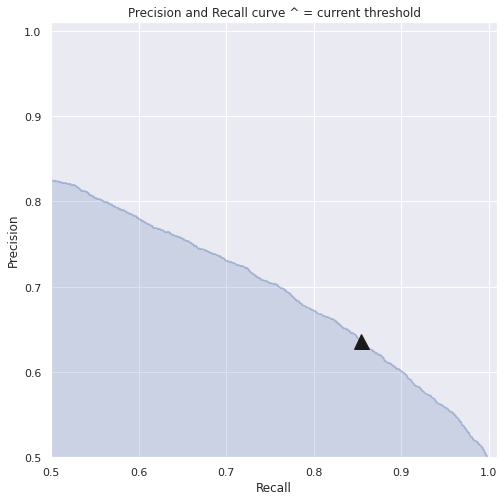

In [145]:

precision_recall_threshold(precision,recall,thresholds,0.30)

**<h2> Model has got bad accuracy ,but model has been optimized for higher recall, on to test set,it has missed 3/5956, Depending on how severe Cardion Vascular Disease based on provided attributes doctors can adjust threshold </h2>**

### Interpretable Machine Learning 


###Interpreting Permutation Importances


In [146]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(catboost_calibrated_model, random_state=1).fit(aTest, y_test)
eli5.show_weights(perm, feature_names = aTest.columns.tolist())



/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)
Using TensorFlow backend.


Weight,Feature
0.1475 ± 0.0082,ap_hi
0.0281 ± 0.0050,cholesterol
0.0255 ± 0.0037,age_bucket
0.0019 ± 0.0017,active
0.0015 ± 0.0020,bmi
0.0015 ± 0.0009,alco
0.0012 ± 0.0007,gender_1
0.0010 ± 0.0007,weight
0.0008 ± 0.0018,ap_lo
-0.0000 ± 0.0002,blood_pressure_level



**Interpreting Permutation Importances**

**ap_hi,age_bucket,cholesterol_lo are most important features,and gender_1,weight are least important**

The values towards the top are the most important features, and those towards the bottom matter least.

The first number in each row shows how much model performance decreased with a random shuffling (in this case, using "accuracy" as the performance metric).

Like most things in data science, there is some randomness to the exact performance change from a shuffling a column. We measure the amount of randomness in our permutation importance calculation by repeating the process with multiple shuffles. The number after the ± measures how performance varied from one-reshuffling to the next.



###Interpreting using PDP Plots

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


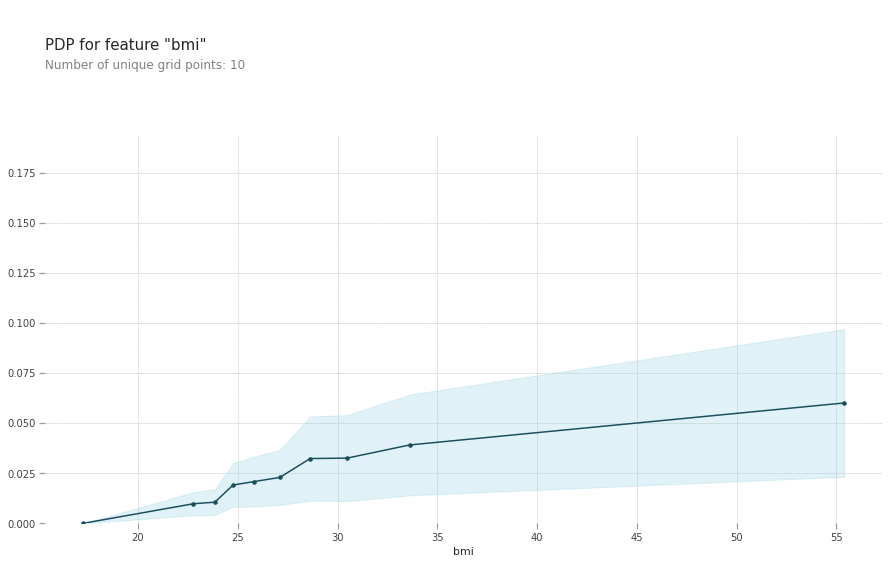

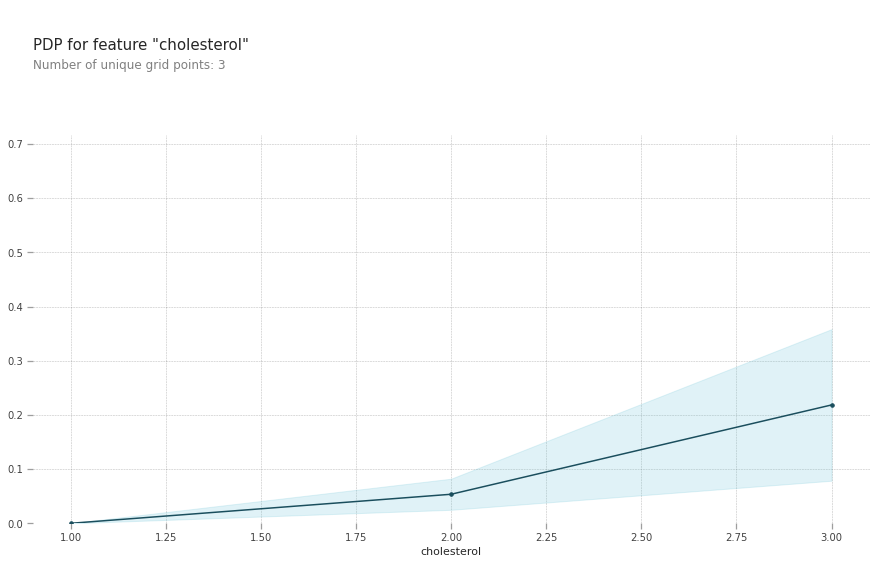

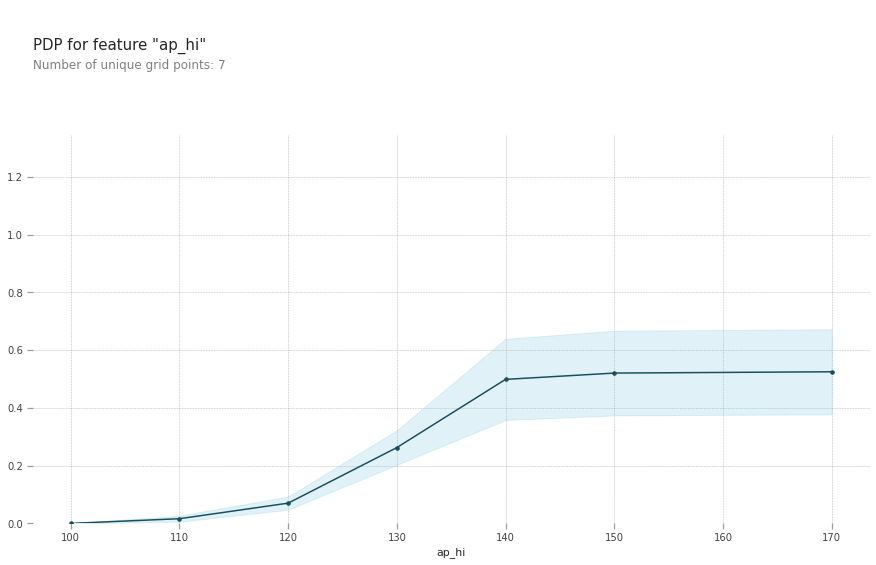

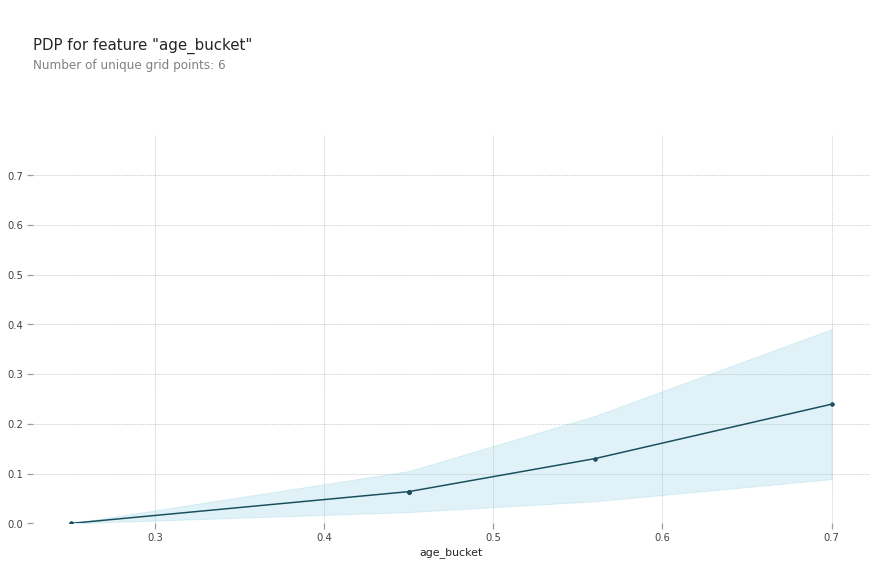

In [147]:

from matplotlib import pyplot as plt
from pdpbox import pdp, get_dataset, info_plots
feat_name = 'bmi'
for feat_name in ['bmi','cholesterol','ap_hi','age_bucket']:
  pdp_dist = pdp.pdp_isolate(model=catboost_calibrated_model, dataset=aTest, model_features=list(aTest.columns), feature=feat_name)
  pdp.pdp_plot(pdp_dist, feat_name)
  plt.show()

A few items are worth pointing out as you interpret this plot
The y axis is interpreted as change in the prediction from what it would be predicted at the baseline or leftmost value. A blue shaded area indicates level of confidence
From this particular graph, we see that 
The slow increase of cholesterol,increases your chances of having cardio disease,beyond 2,there is more impact of Cholesterol on having cardio disease.

1.   The slow increase of cholesterol,increases your chances of having cardio disease,beyond 2,there is more impact of Cholesterol on having cardio disease.

2.   There is substanstial effect of increase in BMI on to Cardio disease,Beyond 35 increase in BMI has less impact on Cardio Disease


3.   Beyond 0.5 ,steep increase in age increases chances of Cardio Disease


4.   ap_hi has consistent high effect on cardio disease till 140,after 140 effect stablizies




In [149]:
!pip install shap
import shap  # package used to calculate Shap values

# Create object that can calculate shap values
explainer = shap.TreeExplainer(catboost_calibrated_model.base_estimator)

# Calculate Shap values
shap_values = explainer.shap_values(aTest)



###Display Shapley variable importance summary


ap_hi,age_bucket,cholesterol is by far the most important variables. 


1.   Low values of ap_hi has less impact of cardio disease,High values of ap_hi has high impact on cardio disease,(montonic relationship)
2.   Higher age has more chances of Cardio disease

2.   Higher cholesterol has more chances of Cardio disease



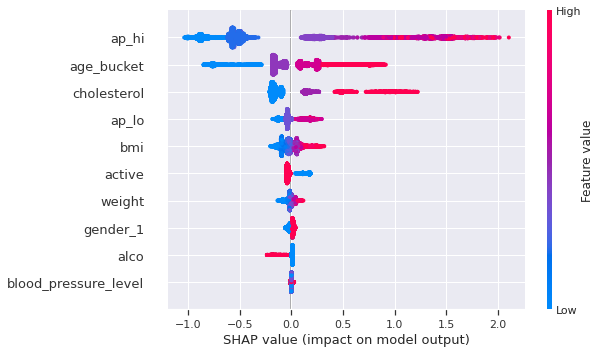

In [150]:
shap.summary_plot(shap_values, aTest)

### Dependence Contribution Plots

Patients between 25-50 with BMI >120 are contributing more towards prediction,high chances of disease

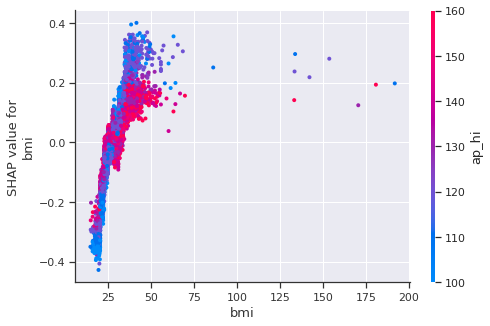

In [219]:
shap.dependence_plot('bmi', shap_values, aTest, interaction_index="ap_hi")


For weight >80 and blood_pressure_level between 0.55 to 0.6 more disease patients are observed

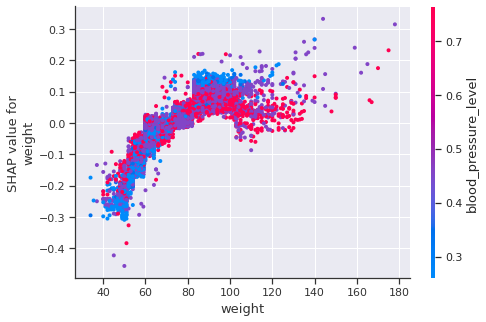

In [266]:
shap.dependence_plot('weight', shap_values, aTest, interaction_index="blood_pressure_level")


### Checking interpretiblity of wrong prediction using LIME 

In [151]:
import lime
import lime.lime_tabular

import eli5
tTest=pd.concat([aTest,y_test],axis=1)
tTest['pred_cardio']=catboost_calibrated_model.predict(tTest.drop('cardio',axis=1))

i=2
lime_explainer = lime.lime_tabular.LimeTabularExplainer(np.array(aTrain), feature_names=np.array(aTrain.columns), class_names=np.array([0, 1]), discretize_continuous=True)

exp = lime_explainer.explain_instance(np.array(aTest)[i], catboost_calibrated_model.predict_proba, num_features=5, top_labels=1)

exp.show_in_notebook(show_table = True, show_all= False)


### Checking interpretiblity of right prediction using LIME

In [152]:
i=4
exp = lime_explainer.explain_instance(np.array(aTest)[i], catboost_calibrated_model.predict_proba, num_features=5, top_labels=1)

exp.show_in_notebook(show_table = True, show_all= False)


### Explain Wrong Prediction for patient having cardio disease

**ap_hi and cholesterod,agebucket are majorly pushing away from base model towards non cardio disease**

In [153]:
i=2
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[i,:], aTest.iloc[i,:], plot_cmap=["#FF5733","#335BFF"])


### Explain Right Prediction for patient having cardio disease using SHAP

Age bucket =0.7 is contributing more towards prediction

In [154]:
i=4
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[i,:], aTest.iloc[i,:], plot_cmap=["#FF5733","#335BFF"])


### Explaining Global Feature contribution using shapely values

 We can also use the force_plot function to look at the explanations for our whole dataset.It allows you to inspect the SHAP values for each observation by hovering the mouse over the plot. By default the observations are clustered together by how similar they are. Foref,the observations from 1e+4 to 1.3e+4 in the plot below are patients whose weights have a very large positive impact on their predictions.

In [155]:

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, aTest)



### Disparate Impact Analysis (DIA) To Study 2 Type Errors for Different Gender

In [156]:

tTest['cardio_prob']=catboost_calibrated_model.predict_proba(aTest)[:,1]

print("===============FOR GENDER 0====================")
#Chosen One 20% Threshold
cm1 = pd.DataFrame()
cm1['Actual'] = tTest[tTest['gender_1']==0]['cardio']
cm1['Predict'] =  [1 if y >=0.20 else 0 for y in tTest[tTest['gender_1']==0]['cardio_prob']]
print(pd.crosstab(cm1['Actual'], cm1['Predict'], margins=True)  )


print("***********************************************")

print("===============FOR GENDER 1====================")
#Chosen One 20% Threshold
cm2 = pd.DataFrame()
cm2['Actual'] = tTest[tTest['gender_1']==1]['cardio']
cm2['Predict'] =  [1 if y >=0.20 else 0 for y in tTest[tTest['gender_1']==1]['cardio_prob']]
print(pd.crosstab(cm2['Actual'], cm2['Predict'], margins=True)  )



metric_dict = {

#### predicting default won't happen
# (correctly)
'Specificity':              'tn / (tn + fp)', 
'Negative Predicted Value': 'tn / (tn + fn)', 

#### analyzing errors - type II
# costly ommisions
'False Negative Rate': 'fn / (tp + fn)', 
'False Omissions Rate':'fn / (tn + fn)' 

}    

def cm_exp_parser(expression):
    
    # tp | fp       cm_dict[level].iat[0, 0] | cm_dict[level].iat[0, 1]
    # -------  ==>  --------------------------------------------
    # fn | tn       cm_dict[level].iat[1, 0] | cm_dict[level].iat[1, 1]

    expression = expression.replace('tp', 'cm_dict[level].iat[0, 0]')\
                           .replace('fp', 'cm_dict[level].iat[0, 1]')\
                           .replace('fn', 'cm_dict[level].iat[1, 0]')\
                           .replace('tn', 'cm_dict[level].iat[1, 1]')

    return expression


cm_dict = {'0': cm1, 
           '1': cm2} 

metrics_frame = pd.DataFrame(index=['0','1']) # frame for metrics

for level in ['0','1']:
    for metric in metric_dict.keys():
    
        # parse metric expressions into executable pandas statements
        expression = cm_exp_parser(metric_dict[metric])
        # dynamically evaluate metrics to avoid code duplication
        metrics_frame.loc[level, metric] = eval(expression)  

# display results                
metrics_frame   

===============FOR GENDER 0====================
Predict    0     1   All
Actual                  
0        422  1815  2237
1         74  2197  2271
All      496  4012  4508
***********************************************
===============FOR GENDER 1====================
Predict    0     1   All
Actual                  
0        729  3093  3822
1        112  3573  3685
All      841  6666  7507


,Specificity,Negative Predicted Value,False Negative Rate,False Omissions Rate
0,0.5,1.0,0.0,0.0
1,0.0,NaN,NaN,NaN


### There are more false negatives for Gender==1,as compared to Gender==0

### Model seems to have gender bias

###Eliminating errors in model predictions by testing:adversarial examples, explanation of residuals,random attacks

#Causal Inference Root cause analysis: can root causes be identified, verified?

**<h3>The causal estimate (the return value of model.estimate_effect) represents the amount of change in the outcome value when you intervene and change the treatment.  I.e., if we increase the value of the treatment by 1.0, then the outcome value will change by the value of ‘estimate’.  If ‘estimate’ is positive, that means the outcome increases with treatment.  If negative, then the outcome decreases with treatment, etc.</h3>**

In [157]:
from IPython.display import Image
Image(url='https://miro.medium.com/max/420/1*lYw_nshU1qg3dqbqgpWoDA.png') 


In [0]:
from dowhy import CausalModel
import dowhy


In [163]:
cTrain=pd.concat([aTrain,y_train],axis=1)
model=CausalModel(
        data = cTrain,
        treatment=['active'],
        outcome='cardio',
       common_causes=['cholesterol','bmi_category','age','gluc','blood_pressure_level']
        )
identified_estimand = model.identify_effect()


estimate = model.estimate_effect(identified_estimand,
        method_name="backdoor.linear_regression", test_significance=True
)

print(estimate)

print("Causal Estimate is " + str(estimate.value))
data_1 = cTrain[cTrain["active"]==1]
data_0 = cTrain[cTrain["active"]==0]

print("ATE", np.mean(data_1["cardio"])- np.mean(data_0["cardio"]))


INFO:dowhy.causal_model:Model to find the causal effect of treatment ['active'] on outcome ['cardio']
INFO:dowhy.causal_identifier:Common causes of treatment and outcome:['cholesterol', 'blood_pressure_level', 'gluc', 'age', 'bmi_category']


WARN: Do you want to continue by ignoring any unobserved confounders? (use proceed_when_unidentifiable=True to disable this prompt) [y/n] Y


INFO:dowhy.causal_identifier:Instrumental variables for treatment and outcome:[]
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~active+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.154
Model:                            OLS   Adj. R-squared:                  0.154
Method:                 Least Squares   F-statistic:                     2913.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:51:27   Log-Likelihood:                -30863.
No. Observations:               48056   AIC:                         6.173e+04
Df Residuals:                   48052   BIC:                         6.177e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1675      0.009    -18.784      0.0

### Checking for RobustNess of our causal estimate

In [164]:
res_placebo=model.refute_estimate(identified_estimand, estimate,
        method_name="placebo_treatment_refuter", placebo_type="permute")
print(res_placebo)



INFO:dowhy.causal_refuters.placebo_treatment_refuter:Refutation over 100 simulated datasets of permute treatment
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:05   Log-Likelihood:                -30909.
No. Observations:               48056   AIC:                         6.183e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2099      0.009    -23.454      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:05   Log-Likelihood:                -30909.
No. Observations:               48056   AIC:                         6.183e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2077      0.009    -23.177      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:05   Log-Likelihood:                -30909.
No. Observations:               48056   AIC:                         6.183e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2051      0.009    -22.917      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2878.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:05   Log-Likelihood:                -30908.
No. Observations:               48056   AIC:                         6.182e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2107      0.009    -23.567      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2878.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:06   Log-Likelihood:                -30908.
No. Observations:               48056   AIC:                         6.182e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2044      0.009    -22.806      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:06   Log-Likelihood:                -30909.
No. Observations:               48056   AIC:                         6.183e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2098      0.009    -23.433      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:06   Log-Likelihood:                -30909.
No. Observations:               48056   AIC:                         6.183e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2082      0.009    -23.254      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:06   Log-Likelihood:                -30909.
No. Observations:               48056   AIC:                         6.183e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2101      0.009    -23.438      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:07   Log-Likelihood:                -30909.
No. Observations:               48056   AIC:                         6.183e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2085      0.009    -23.292      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:07   Log-Likelihood:                -30908.
No. Observations:               48056   AIC:                         6.182e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2046      0.009    -22.894      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:07   Log-Likelihood:                -30909.
No. Observations:               48056   AIC:                         6.183e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2048      0.009    -22.915      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2878.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:07   Log-Likelihood:                -30908.
No. Observations:               48056   AIC:                         6.182e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2042      0.009    -22.879      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2878.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:08   Log-Likelihood:                -30907.
No. Observations:               48056   AIC:                         6.182e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2143      0.009    -23.866      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2879.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:08   Log-Likelihood:                -30906.
No. Observations:               48056   AIC:                         6.182e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1983      0.009    -22.123      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:08   Log-Likelihood:                -30909.
No. Observations:               48056   AIC:                         6.183e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2059      0.009    -23.015      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:08   Log-Likelihood:                -30909.
No. Observations:               48056   AIC:                         6.183e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2086      0.009    -23.357      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2878.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:09   Log-Likelihood:                -30908.
No. Observations:               48056   AIC:                         6.182e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2134      0.009    -23.878      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:09   Log-Likelihood:                -30909.
No. Observations:               48056   AIC:                         6.183e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2069      0.009    -23.077      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:09   Log-Likelihood:                -30909.
No. Observations:               48056   AIC:                         6.183e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2068      0.009    -23.116      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2878.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:09   Log-Likelihood:                -30908.
No. Observations:               48056   AIC:                         6.182e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2136      0.009    -23.892      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2878.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:10   Log-Likelihood:                -30908.
No. Observations:               48056   AIC:                         6.182e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2044      0.009    -22.834      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2878.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:10   Log-Likelihood:                -30908.
No. Observations:               48056   AIC:                         6.182e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2020      0.009    -22.555      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:10   Log-Likelihood:                -30909.
No. Observations:               48056   AIC:                         6.183e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2067      0.009    -23.052      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2877.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:10   Log-Likelihood:                -30909.
No. Observations:               48056   AIC:                         6.183e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2093      0.009    -23.375      0.0

INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level
INFO:dowhy.causal_estimator:INFO: Using Linear Regression Estimator
INFO:dowhy.causal_estimator:b: cardio~placebo+cholesterol+blood_pressure_level


                            OLS Regression Results                            
Dep. Variable:                 cardio   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     2878.
Date:                Fri, 15 May 2020   Prob (F-statistic):               0.00
Time:                        19:52:11   Log-Likelihood:                -30908.
No. Observations:               48056   AIC:                         6.182e+04
Df Residuals:                   48052   BIC:                         6.186e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2123      0.009    -23.690      0.0

INFO:dowhy.causal_refuters.placebo_treatment_refuter:Making use of Bootstrap as we have more than 100 examples.
                 Note: The greater the number of examples, the more accurate are the confidence estimates


Refute: Use a Placebo Treatment
Estimated effect:-0.0504517765791227
New effect:2.0517408255495416e-05
p value:0.45999999999999996



**<h3>If people get physically active,even if they are having high BMI,high cholesterol,there chances of cardio disease decreases Since Causal Estimate Here is -0.0504 i.e decreases by 5%</h3>**


INFO:dowhy.causal_graph:Using Matplotlib for plotting


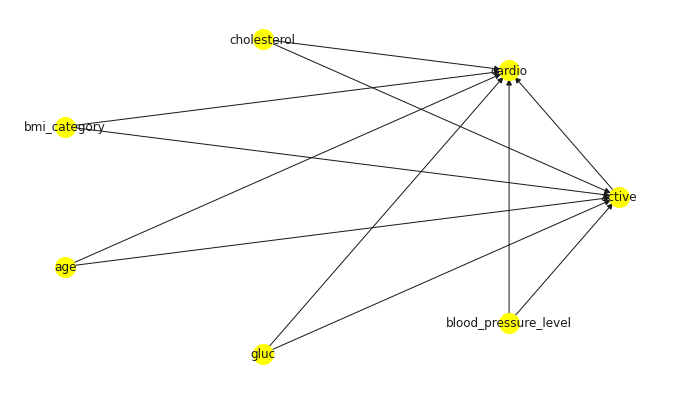

In [165]:
model.view_model()

**<h3><h3>**